<a href="https://colab.research.google.com/github/SALAH-ESLIM/Data-analysis-/blob/main/Salah_ESLIM_Airpollution_assessment_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Air pollution Analysis

Module Code: CMP7005
Module Title: Programming for Data Analysis
Academic year:2024-2025

Mitigate air pollution through the forecasting of air quality in Beijing (capital of China)

This project analyzes hourly air quality data from 12 monitoring stations in Beijing, spanning 2013 to 2017. It includes both pollutant measurements (PM2.5, PM10, SO2, NO2, CO, O3) and meteorological conditions (wind speed, rainfall, temperature, dew point, and pressure). The goal is to apply programming-driven techniques to process and analyze the data, solving real-world problems while utilizing version control and collaboration tools for effective workflow management.

#Task 1 : Data Handling

To handle the data we have to do some process








1- import necessary libraries that i work on it.

2- Import, select and merge data.

3- site type classification (categorize the station by type as requested ((urban, suburban, rural, industrial)

5- Saves the updated dataset with the site type information

1- Import the necessary libraries.

In [18]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import os
import glob

2- Import select and merge data.

In [19]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [20]:
%cd '/content/drive/MyDrive/data sets/Merged cities '

/content/drive/MyDrive/data sets/Merged cities 


In [21]:
%ls

 app.py
'Copy of PRSA_Data_Gucheng_20130301-20170228.csv'
 merged_data.csv
 PRSA_Data_Changping_20130301-20170228.csv
 PRSA_Data_Dingling_20130301-20170228.csv
 PRSA_Data_Dongsi_20130301-20170228.csv
 random_forest_pm25_model.joblib


In [22]:
import pandas as pd
# Define the dataset file paths
df1 = pd.read_csv('/content/drive/MyDrive/data sets/Merged cities /Copy of PRSA_Data_Gucheng_20130301-20170228.csv')
df2= pd.read_csv('/content/drive/MyDrive/data sets/Merged cities /PRSA_Data_Changping_20130301-20170228.csv')
df3= pd.read_csv('/content/drive/MyDrive/data sets/Merged cities /PRSA_Data_Dingling_20130301-20170228.csv')
df4= pd.read_csv('/content/drive/MyDrive/data sets/Merged cities /PRSA_Data_Dongsi_20130301-20170228.csv')
df=pd.concat([df1,df2,df3,df4],ignore_index=True)
df.to_csv('/content/drive/MyDrive/data sets/Merged cities /merged_data.csv', index=False)
print("Merged dataset saved as 'merged_dataset.csv'.")

Merged dataset saved as 'merged_dataset.csv'.


In [23]:
df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,6.0,18.0,5.0,NaN,800.0,88.0,0.1,1021.1,-18.6,0.0,NW,4.4,Gucheng
1,2,2013,3,1,1,6.0,15.0,5.0,NaN,800.0,88.0,-0.3,1021.5,-19.0,0.0,NW,4.0,Gucheng
2,3,2013,3,1,2,5.0,18.0,NaN,NaN,700.0,52.0,-0.7,1021.5,-19.8,0.0,WNW,4.6,Gucheng
3,4,2013,3,1,3,6.0,20.0,6.0,NaN,NaN,NaN,-1.0,1022.7,-21.2,0.0,W,2.8,Gucheng
4,5,2013,3,1,4,5.0,17.0,5.0,NaN,600.0,73.0,-1.3,1023.0,-21.4,0.0,WNW,3.6,Gucheng


In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 140256 entries, 0 to 140255
Data columns (total 18 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   No       140256 non-null  int64  
 1   year     140256 non-null  int64  
 2   month    140256 non-null  int64  
 3   day      140256 non-null  int64  
 4   hour     140256 non-null  int64  
 5   PM2.5    137307 non-null  float64
 6   PM10     138084 non-null  float64
 7   SO2      137728 non-null  float64
 8   NO2      136086 non-null  float64
 9   CO       132125 non-null  float64
 10  O3       137045 non-null  float64
 11  TEMP     140079 non-null  float64
 12  PRES     140086 non-null  float64
 13  DEWP     140079 non-null  float64
 14  RAIN     140091 non-null  float64
 15  wd       139739 non-null  object 
 16  WSPM     140114 non-null  float64
 17  station  140256 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 19.3+ MB


- READ AND VISUALIZ DATA

Display basic information before modification

 site type classification (categorize the station by type as requested ((urban, suburban, rural, industrial) and check if there is any douplication

Define site types mapping for just the four specific sites

In [25]:
site_types = {
    'Dongsi': 'urban',        # Urban site in central Beijing
    'Changping': 'suburban',  # Suburban area
    'Dingling': 'rural',      # Rural site in northern Beijing
    'Gucheng': 'industrial'   # Industrial area
}

#TASK 2:

##Exploratory Data Analysis (EDA):

###a) Fundamental data understanding

#### Understanding data need  to know the following point:
1-Number of rows and columns
2-Data types of each column
3-Sample values in the dataset
4-Missing values and their distribution
5-Brief interpretation of the datase

In [27]:
print("\nFirst 5 rows of the dataset with site types:")
print(df.head())


First 5 rows of the dataset with site types:
   No  year  month  day  hour  PM2.5  PM10  SO2  NO2     CO    O3  TEMP  \
0   1  2013      3    1     0    6.0  18.0  5.0  NaN  800.0  88.0   0.1   
1   2  2013      3    1     1    6.0  15.0  5.0  NaN  800.0  88.0  -0.3   
2   3  2013      3    1     2    5.0  18.0  NaN  NaN  700.0  52.0  -0.7   
3   4  2013      3    1     3    6.0  20.0  6.0  NaN    NaN   NaN  -1.0   
4   5  2013      3    1     4    5.0  17.0  5.0  NaN  600.0  73.0  -1.3   

     PRES  DEWP  RAIN   wd  WSPM  station  
0  1021.1 -18.6   0.0   NW   4.4  Gucheng  
1  1021.5 -19.0   0.0   NW   4.0  Gucheng  
2  1021.5 -19.8   0.0  WNW   4.6  Gucheng  
3  1022.7 -21.2   0.0    W   2.8  Gucheng  
4  1023.0 -21.4   0.0  WNW   3.6  Gucheng  


Display the number of rows and columns

In [30]:
# Number of rows and columns
print("Dataset Shape (Rows, Columns):", df.shape)

Dataset Shape (Rows, Columns): (140256, 18)


Display basic information about the missing value and data types

In [31]:
print("Dataset Info:")
df.info()

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 140256 entries, 0 to 140255
Data columns (total 18 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   No       140256 non-null  int64  
 1   year     140256 non-null  int64  
 2   month    140256 non-null  int64  
 3   day      140256 non-null  int64  
 4   hour     140256 non-null  int64  
 5   PM2.5    137307 non-null  float64
 6   PM10     138084 non-null  float64
 7   SO2      137728 non-null  float64
 8   NO2      136086 non-null  float64
 9   CO       132125 non-null  float64
 10  O3       137045 non-null  float64
 11  TEMP     140079 non-null  float64
 12  PRES     140086 non-null  float64
 13  DEWP     140079 non-null  float64
 14  RAIN     140091 non-null  float64
 15  wd       139739 non-null  object 
 16  WSPM     140114 non-null  float64
 17  station  140256 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 19.3+ MB


Summary statistics for numerical columns

In [32]:
print("\nDescriptive statistics for numeric columns:")
print(df.describe().round(1))


Descriptive statistics for numeric columns:
             No      year     month       day      hour     PM2.5      PM10  \
count  140256.0  140256.0  140256.0  140256.0  140256.0  137307.0  138084.0   
mean    17532.5    2014.7       6.5      15.7      11.5      76.8     101.9   
std     10122.1       1.2       3.4       8.8       6.9      79.2      90.9   
min         1.0    2013.0       1.0       1.0       0.0       2.0       2.0   
25%      8766.8    2014.0       4.0       8.0       5.8      19.0      34.0   
50%     17532.5    2015.0       7.0      16.0      11.5      52.0      79.0   
75%     26298.2    2016.0      10.0      23.0      17.2     107.0     143.0   
max     35064.0    2017.0      12.0      31.0      23.0     882.0     999.0   

            SO2       NO2        CO        O3      TEMP      PRES      DEWP  \
count  137728.0  136086.0  132125.0  137045.0  140079.0  140086.0  140079.0   
mean       15.2      45.4    1177.0      60.3      13.7    1009.2       2.0   
std   

Display the total number of missing values in each column and analyis it.

In [33]:
# Count missing values by column
missing_values = df.isnull().sum()
print("\nMissing values by column:")
print(missing_values)
print(f"\nPercentage of missing values in the dataset: {df.isnull().sum().sum() / (df.shape[0] * df.shape[1]) * 100:.2f}%")


Missing values by column:
No            0
year          0
month         0
day           0
hour          0
PM2.5      2949
PM10       2172
SO2        2528
NO2        4170
CO         8131
O3         3211
TEMP        177
PRES        170
DEWP        177
RAIN        165
wd          517
WSPM        142
station       0
dtype: int64

Percentage of missing values in the dataset: 0.97%


Function to analyze missing values

In [34]:

def missing_values_table(df):
    # Total missing values
    mis_val = df.isnull().sum()

    # Percentage of missing values
    mis_val_percent = 100 * df.isnull().sum() / len(df)

    # Combine results into a DataFrame
    mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)

    # Rename the columns for clarity
    mis_val_table.columns = ['Missing Values', '% of Total Values']

    # Sort the table by percentage of missing values in descending order
    mis_val_table = mis_val_table[mis_val_table['Missing Values'] > 0]
    mis_val_table = mis_val_table.sort_values('% of Total Values', ascending=False)

    return mis_val_table

# Analyze missing values in the dataset
missing_values = missing_values_table(df)

# Display the missing values table with a gradient for better visualization
print("\nMissing Values Table:")
print(missing_values)
missing_values.style.background_gradient(cmap='Oranges')


Missing Values Table:
       Missing Values  % of Total Values
CO               8131           5.797256
NO2              4170           2.973135
O3               3211           2.289385
PM2.5            2949           2.102584
SO2              2528           1.802418
PM10             2172           1.548597
wd                517           0.368612
TEMP              177           0.126198
DEWP              177           0.126198
PRES              170           0.121207
RAIN              165           0.117642
WSPM              142           0.101243


,Missing Values,% of Total Values
CO,8131,5.797256
NO2,4170,2.973135
O3,3211,2.289385
PM2.5,2949,2.102584
SO2,2528,1.802418
PM10,2172,1.548597
wd,517,0.368612
TEMP,177,0.126198
DEWP,177,0.126198
PRES,170,0.121207


#b) Data preprocessing

##step1:Handle missing values

### pollutants (PM2.5, PM10, SO2, NO2, CO, O3) are critical for analysis so we will use median imputation to avoid bias caused by extreme values and meteorological_columns = ['TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM']

In [35]:
pollutant_columns = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3']
for col in pollutant_columns:
    df[col].fillna(df[col].median(), inplace=True)
meteorological_columns = ['TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM']
for col in meteorological_columns:
    df[col].fillna(df[col].mean(), inplace=True)

<ipython-input-35-4ca78a72e1b9>:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(df[col].median(), inplace=True)
<ipython-input-35-4ca78a72e1b9>:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 

### we will use mode imputation for categorical columns (wd)as it is categorical.

In [36]:
    # Categorical column - use mode for 'wd'
    df['wd'].fillna(df['wd'].mode()[0], inplace=True)

<ipython-input-36-5b915dcfa0cd>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['wd'].fillna(df['wd'].mode()[0], inplace=True)


In [37]:
print("\nRemaining missing values after imputation:")
print(df.isnull().sum())



Remaining missing values after imputation:
No         0
year       0
month      0
day        0
hour       0
PM2.5      0
PM10       0
SO2        0
NO2        0
CO         0
O3         0
TEMP       0
PRES       0
DEWP       0
RAIN       0
wd         0
WSPM       0
station    0
dtype: int64


Step 2 : Remove doublicates value (double check)

In [38]:
print("\nChecking for duplicates...")
duplicate_count = df.duplicated().sum()
if duplicate_count > 0:
    print(f"Found {duplicate_count} duplicate rows. Removing them...")
    df.drop_duplicates(inplace=True)
else:
    print("No duplicate rows found.")


Checking for duplicates...
No duplicate rows found.


##Step 3: Feature Engineering

1-Combine 'year', 'month', and 'day' into a single 'date' column


In [39]:
df['datetime'] = pd.to_datetime(df[['year', 'month', 'day', 'hour']])

 2- Add a 'season' feature based on the month

In [ ]:
# Add a 'season' feature based on the month
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Autumn'

df['season'] = df['month'].apply(get_season)


3- Add a 'day_of_week' feature based on the datetime column

In [40]:
df['day_of_week'] = df['datetime'].dt.day_name()

4- Add a 'is_weekend' feature (1 if Saturday/Sunday, 0 otherwise)

In [41]:
df['is_weekend'] = df['day_of_week'].apply(lambda x: 1 if x in ['Saturday', 'Sunday'] else 0)

5- Extract year and month as 'YYYY-MM' will be beneficial for monthly trend analysis and seasonal analysis instead of hourly

In [42]:
df['year_month'] = df['datetime'].dt.to_period('M')

6- Add column Hour of day to check air quality over the day

In [43]:
df['hour_of_day'] = df['hour']

7- Create AQI (Air Quality Index) feature based on PM2.5

In [44]:
def categorize_pm25(pm25):
    if pm25 <= 50:
        return 'Good'
    elif pm25 <= 100:
        return 'Moderate'
    elif pm25 <= 150:
        return 'Unhealthy for Sensitive Groups'
    elif pm25 <= 200:
        return 'Unhealthy'
    elif pm25 <= 300:
        return 'Very Unhealthy'
    else:
        return 'Hazardous'

df['pollution_category'] = df['PM2.5'].apply(categorize_pm25)


8- Convert wind direction to numeric for analysis purposes
and Create wind direction encoding (circular feature)

In [45]:
wind_dir_map = {
    'N': 0, 'NNE': 22.5, 'NE': 45, 'ENE': 67.5,
    'E': 90, 'ESE': 112.5, 'SE': 135, 'SSE': 157.5,
    'S': 180, 'SSW': 202.5, 'SW': 225, 'WSW': 247.5,
    'W': 270, 'WNW': 292.5, 'NW': 315, 'NNW': 337.5
}
df['wd_numeric'] = df['wd'].map(wind_dir_map)

9-Add a 'wind_speed_category' feature based on WSPM levels

In [46]:
def categorize_wind_speed(wspm):
    if wspm < 1.5:
        return 'Calm'
    elif wspm < 3.3:
        return 'Light Breeze'
    elif wspm < 5.5:
        return 'Moderate Breeze'
    elif wspm < 7.9:
        return 'Fresh Breeze'
    else:
        return 'Strong Wind'

df['wind_speed_category'] = df['WSPM'].apply(categorize_wind_speed)


Add some interaction featuere to show relationship between some variables and help in improve predictive model.

In [47]:
df.columns

Index(['No', 'year', 'month', 'day', 'hour', 'PM2.5', 'PM10', 'SO2', 'NO2',
       'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'wd', 'WSPM', 'station',
       'datetime', 'day_of_week', 'is_weekend', 'year_month', 'hour_of_day',
       'pollution_category', 'wd_numeric', 'wind_speed_category'],
      dtype='object')

In [48]:
# Add interaction features
df['PM2.5_TEMP_interaction'] = df['PM2.5'] * df['TEMP']
df['PM10_WSPM_interaction'] = df['PM10'] * df['WSPM']
df['RAIN_PM2.5_interaction'] = df['RAIN'] * df['PM2.5']

# Check the first few rows to ensure the features were added
print("\nDataset with Interaction Features:")
print(df.head())


Dataset with Interaction Features:
   No  year  month  day  hour  PM2.5  PM10  SO2   NO2     CO  ...  \
0   1  2013      3    1     0    6.0  18.0  5.0  37.0  800.0  ...   
1   2  2013      3    1     1    6.0  15.0  5.0  37.0  800.0  ...   
2   3  2013      3    1     2    5.0  18.0  7.0  37.0  700.0  ...   
3   4  2013      3    1     3    6.0  20.0  6.0  37.0  800.0  ...   
4   5  2013      3    1     4    5.0  17.0  5.0  37.0  600.0  ...   

   day_of_week  is_weekend  year_month  hour_of_day  pollution_category  \
0       Friday           0     2013-03            0                Good   
1       Friday           0     2013-03            1                Good   
2       Friday           0     2013-03            2                Good   
3       Friday           0     2013-03            3                Good   
4       Friday           0     2013-03            4                Good   

  wd_numeric  wind_speed_category PM2.5_TEMP_interaction  \
0      315.0      Moderate Breeze     

Check for outliers in the pollutant columns by using Interquartile Range (IQR) Method by measuring the spread between the first quartile Q1 and third quartile Q3 that any data bleow Q1 AND ABOVE Q3 is considered an outlier.


Descriptive Statistics Before Clipping:
               PM2.5           PM10            SO2            NO2  \
count  140256.000000  140256.000000  140256.000000  140256.000000   
mean       72.472980      98.235829      12.984795      44.640966   
std        65.679197      78.076058      13.575761      31.734036   
min         2.000000       2.000000       0.285600       1.026500   
25%        19.000000      35.000000       2.000000      19.914100   
50%        52.000000      79.000000       7.000000      37.000000   
75%       106.000000     141.000000      19.000000      64.000000   
max       236.500000     300.000000      44.500000     130.128850   

                  CO             O3  
count  140256.000000  140256.000000  
mean     1051.820892      58.196252  
std       753.469210      48.858372  
min       100.000000       0.214200  
25%       500.000000      17.000000  
50%       800.000000      50.000000  
75%      1400.000000      83.000000  
max      2750.000000     182.0000

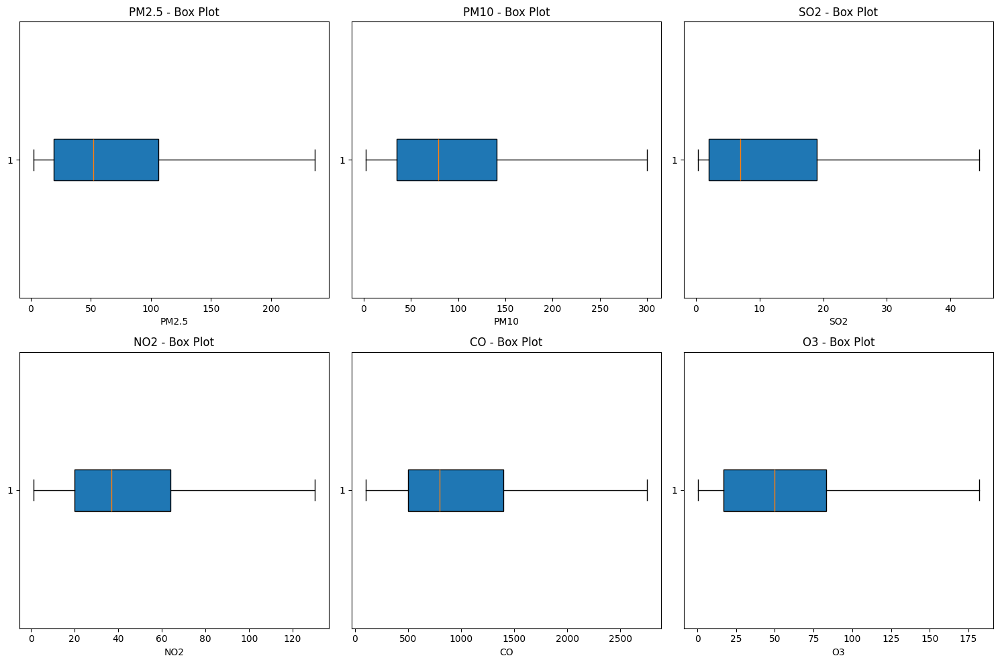


Outlier Summary (IQR Method):
PM2.5: 0 outliers
PM10: 0 outliers
SO2: 0 outliers
NO2: 0 outliers
CO: 0 outliers
O3: 0 outliers


In [50]:
# List of pollutant columns to check for outliers
pollutant_columns = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3']

# Function to detect outliers using IQR
def detect_outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
    return outliers, lower_bound, upper_bound

    # Display descriptive statistics before clipping
print("\nDescriptive Statistics Before Clipping:")
print(df[pollutant_columns].describe())

# Visualize outliers using box plots
plt.figure(figsize=(15, 10))
for i, col in enumerate(pollutant_columns, 1):
    plt.subplot(2, 3, i)
    plt.boxplot(df[col].dropna(), vert=False, patch_artist=True)
    plt.title(f'{col} - Box Plot')
    plt.xlabel(col)

plt.tight_layout()
plt.show()

# Detect and count outliers for each pollutant column
outlier_summary = {}
for col in pollutant_columns:
    outliers, lower_bound, upper_bound = detect_outliers_iqr(df, col)
    outlier_summary[col] = len(outliers)

    # Clip the outliers to the lower and upper bounds
    df[col] = df[col].clip(lower=lower_bound, upper=upper_bound)

# Display the outlier summary
print("\nOutlier Summary (IQR Method):")
for col, count in outlier_summary.items():
    print(f"{col}: {count} outliers")

# Step 5: Save the Cleaned and Enhanced Dataset

In [62]:
os.makedirs('/content/drive/MyDrive/data sets/Merged cities', exist_ok=True)


In [65]:
import os
print(os.path.exists('/content/drive/MyDrive/data sets/Merged cities /analyzed_data'))


True


In [66]:
from google.colab import drive
import pandas as pd

# Mount Google Drive
drive.mount('/content/drive')

# Define the save path
save_path = '/content/drive/MyDrive/data sets/Merged cities /analyzed_data.csv'

# Save your processed dataset (replace 'df' with your DataFrame)
df.to_csv(save_path, index=False)

print(f"Analyzed dataset saved successfully to '{save_path}'.")




Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Analyzed dataset saved successfully to '/content/drive/MyDrive/data sets/Merged cities /analyzed_data.csv'.


In [67]:
print("\nRemaining missing values after imputation:")
print(df.isnull().sum())


Remaining missing values after imputation:
No                        0
year                      0
month                     0
day                       0
hour                      0
PM2.5                     0
PM10                      0
SO2                       0
NO2                       0
CO                        0
O3                        0
TEMP                      0
PRES                      0
DEWP                      0
RAIN                      0
wd                        0
WSPM                      0
station                   0
datetime                  0
day_of_week               0
is_weekend                0
year_month                0
hour_of_day               0
pollution_category        0
wd_numeric                0
wind_speed_category       0
PM2.5_TEMP_interaction    0
PM10_WSPM_interaction     0
RAIN_PM2.5_interaction    0
dtype: int64


# Display the first few rows of the enhanced dataset

In [68]:
print("\nFirst 5 rows of the enhanced dataset:")
print(df.head(5))


First 5 rows of the enhanced dataset:
   No  year  month  day  hour  PM2.5  PM10  SO2   NO2     CO  ...  \
0   1  2013      3    1     0    6.0  18.0  5.0  37.0  800.0  ...   
1   2  2013      3    1     1    6.0  15.0  5.0  37.0  800.0  ...   
2   3  2013      3    1     2    5.0  18.0  7.0  37.0  700.0  ...   
3   4  2013      3    1     3    6.0  20.0  6.0  37.0  800.0  ...   
4   5  2013      3    1     4    5.0  17.0  5.0  37.0  600.0  ...   

   day_of_week  is_weekend  year_month  hour_of_day  pollution_category  \
0       Friday           0     2013-03            0                Good   
1       Friday           0     2013-03            1                Good   
2       Friday           0     2013-03            2                Good   
3       Friday           0     2013-03            3                Good   
4       Friday           0     2013-03            4                Good   

  wd_numeric  wind_speed_category PM2.5_TEMP_interaction  \
0      315.0      Moderate Breeze  

##c) Statistical Analysis and Visualization

There is different analysis

1- Univariate Analysis: Visualizations (histograms, box plots, bar chart) for individual variables, including pollutant data and categorical features like site_type



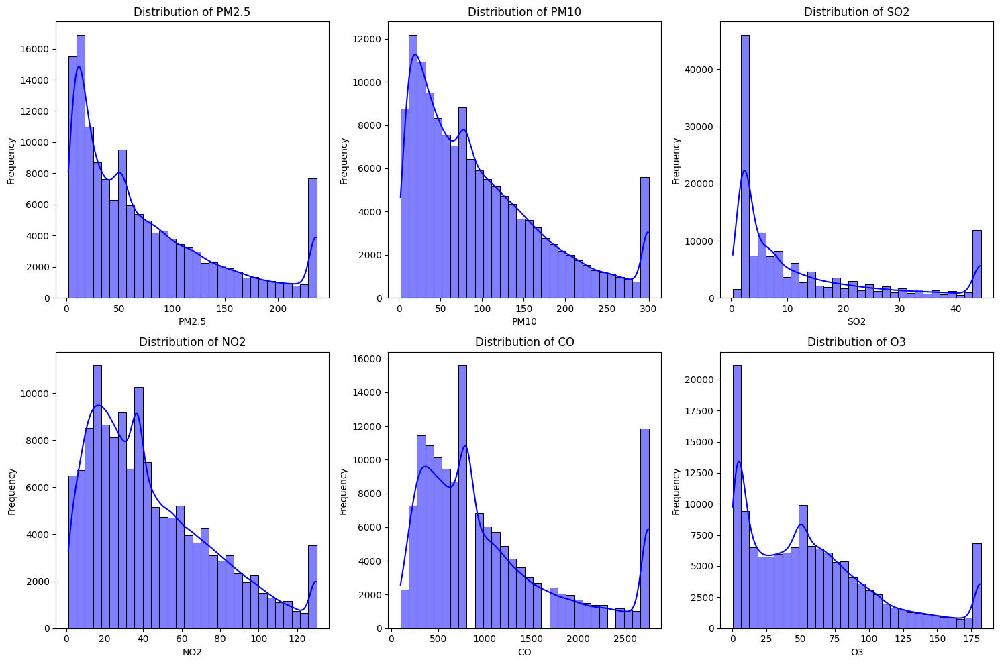

In [69]:
# Histograms for pollutant levels
pollutant_columns = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3']
plt.figure(figsize=(15, 10))
for i, col in enumerate(pollutant_columns, 1):
    plt.subplot(2, 3, i)
    sns.histplot(df[col], kde=True, bins=30, color='blue')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


In [70]:
print("Available columns in the DataFrame:")
print(df.columns)

Available columns in the DataFrame:
Index(['No', 'year', 'month', 'day', 'hour', 'PM2.5', 'PM10', 'SO2', 'NO2',
       'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'wd', 'WSPM', 'station',
       'datetime', 'day_of_week', 'is_weekend', 'year_month', 'hour_of_day',
       'pollution_category', 'wd_numeric', 'wind_speed_category',
       'PM2.5_TEMP_interaction', 'PM10_WSPM_interaction',
       'RAIN_PM2.5_interaction'],
      dtype='object')


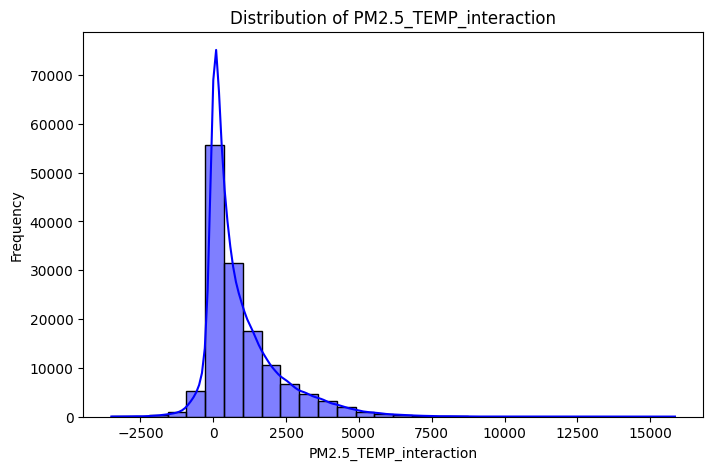

In [71]:

plt.figure(figsize=(8, 5))
sns.histplot(df['PM2.5_TEMP_interaction'], kde=True, bins=30, color='blue')
plt.title("Distribution of PM2.5_TEMP_interaction")
plt.xlabel("PM2.5_TEMP_interaction")
plt.ylabel("Frequency")
plt.show()

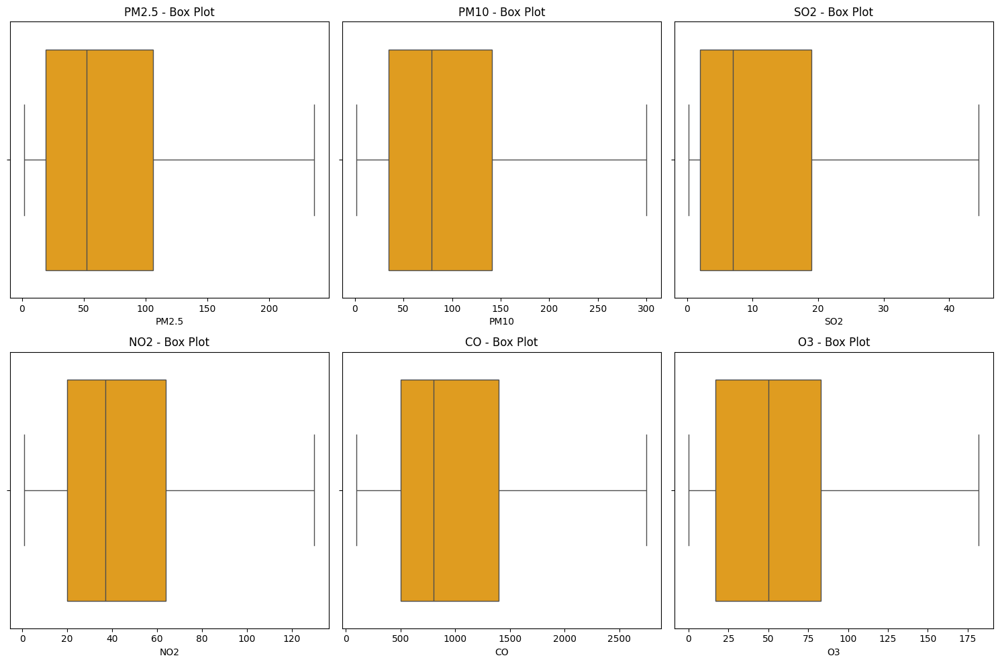

In [72]:
# Box plots to identify outliers
plt.figure(figsize=(15, 10))
for i, col in enumerate(pollutant_columns, 1):
    plt.subplot(2, 3, i)
    sns.boxplot(x=df[col], color='orange')
    plt.title(f'{col} - Box Plot')
    plt.xlabel(col)

plt.tight_layout()
plt.show()

<ipython-input-73-ca55e2154ade>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='station', data=df, palette='Set2')


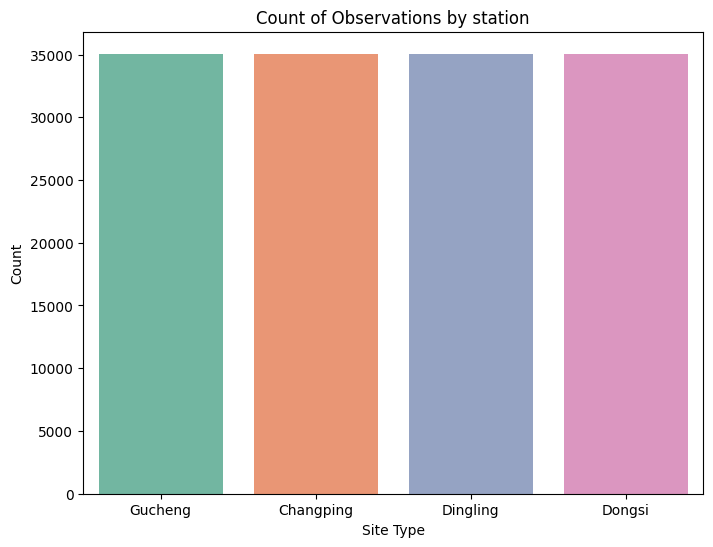

In [73]:
# Bar plot for categorical variables (e.g., site_type)
plt.figure(figsize=(8, 6))
sns.countplot(x='station', data=df, palette='Set2')
plt.title('Count of Observations by station')
plt.xlabel('Site Type')
plt.ylabel('Count')
plt.show()

<ipython-input-74-03a42c4a7a03>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='pollution_category', data=df, palette='coolwarm', order=df['pollution_category'].value_counts().index)


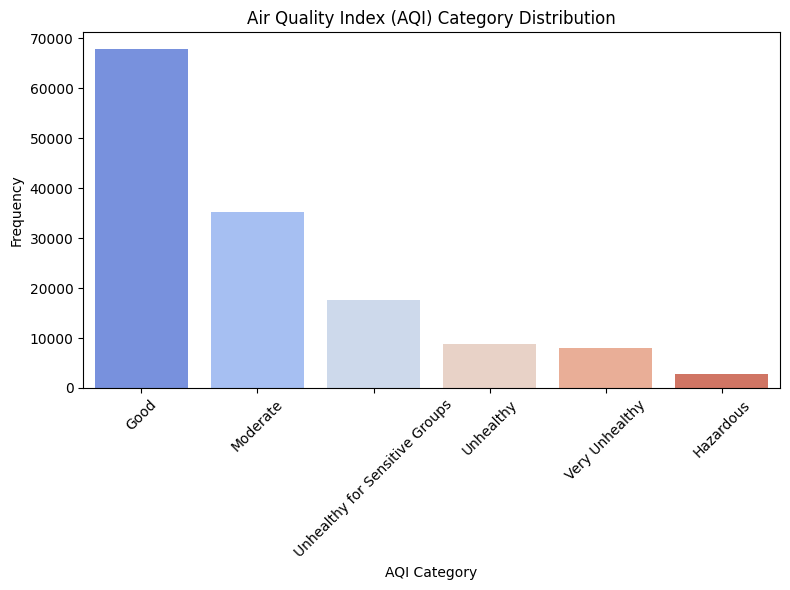

In [74]:
plt.figure(figsize=(8, 6))
sns.countplot(x='pollution_category', data=df, palette='coolwarm', order=df['pollution_category'].value_counts().index)
plt.title('Air Quality Index (AQI) Category Distribution')
plt.xlabel('AQI Category')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 2. Bivariate Analysis

Correlation between pollutants and weather by using Heatmap

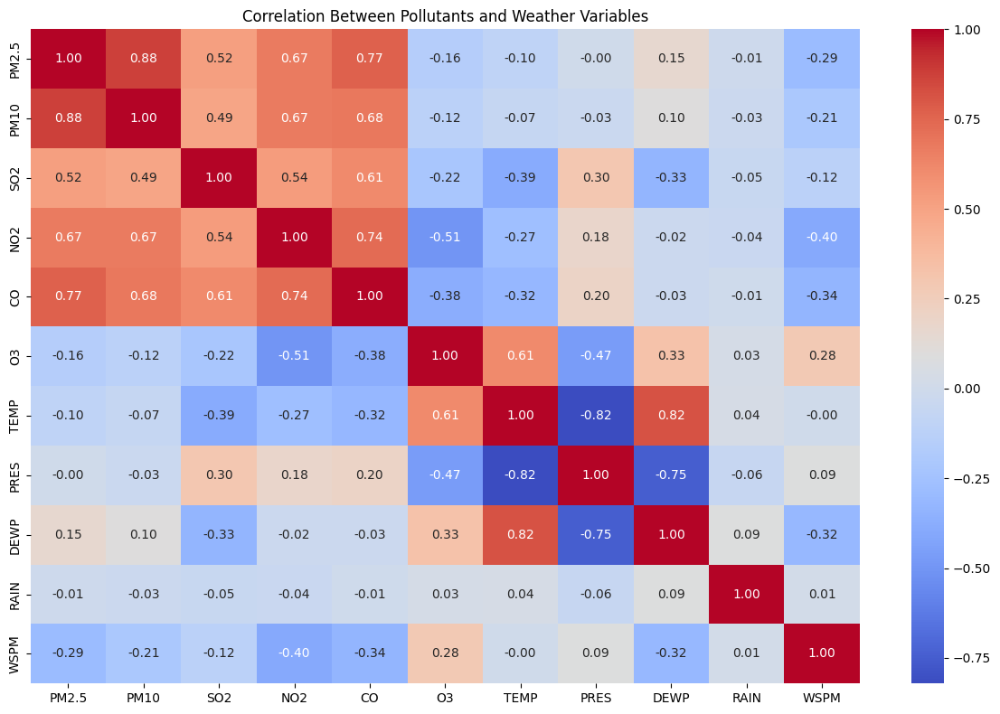

In [75]:

# Select pollutant and weather variables for correlation analysis
pollutants = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3']
weather = ['TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM']

# Compute the correlation matrix
correlation_matrix = df[pollutants + weather].corr()

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)
plt.title('Correlation Between Pollutants and Weather Variables')
plt.tight_layout()
plt.show()

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


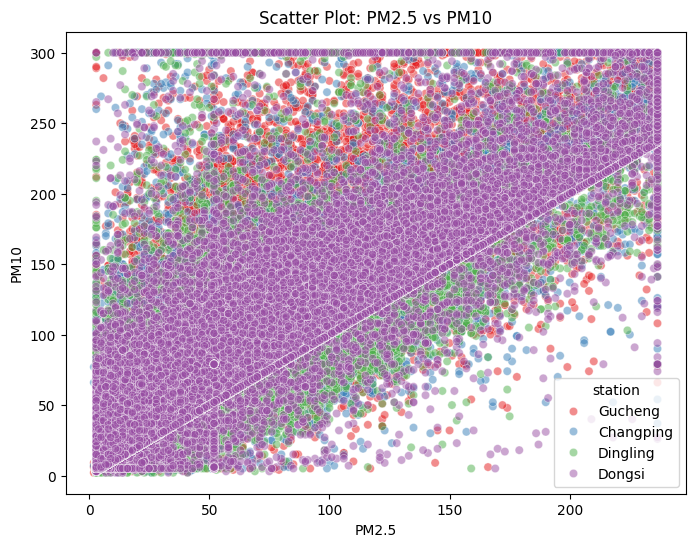

In [76]:
# Scatter plot: PM2.5 vs. PM10
plt.figure(figsize=(8, 6))
sns.scatterplot(x='PM2.5', y='PM10', data=df, alpha=0.5, hue='station', palette='Set1')
plt.title('Scatter Plot: PM2.5 vs PM10')
plt.xlabel('PM2.5')
plt.ylabel('PM10')
plt.legend(title='station')
plt.show()

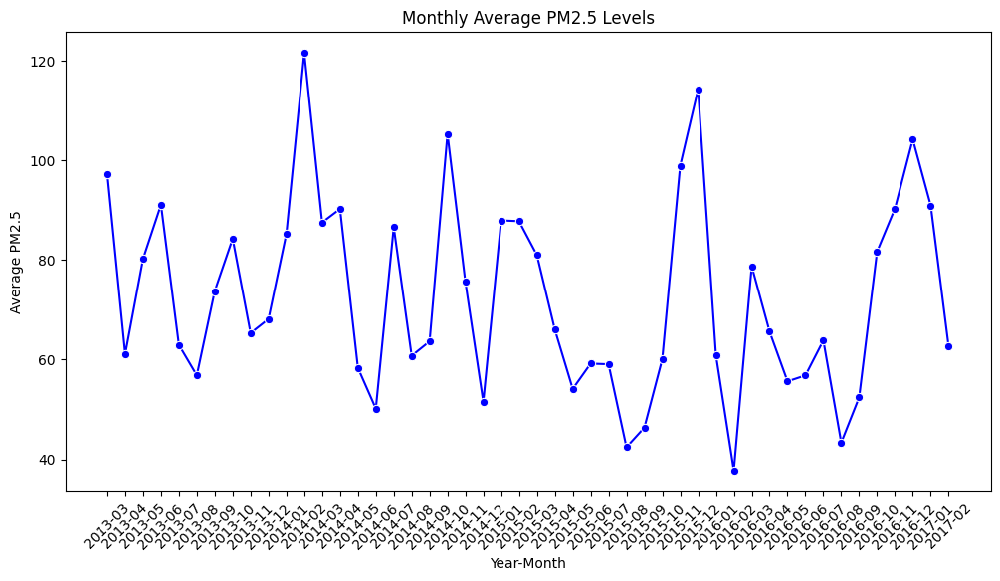

In [77]:
# Ensure year_month is converted to string for plotting compatibility
monthly_avg = df.groupby('year_month')['PM2.5'].mean().reset_index()
monthly_avg['year_month'] = monthly_avg['year_month'].astype(str)  # Convert to string

# Plot the line chart
plt.figure(figsize=(12, 6))
sns.lineplot(x='year_month', y='PM2.5', data=monthly_avg, marker='o', color='blue')
plt.title('Monthly Average PM2.5 Levels')
plt.xlabel('Year-Month')
plt.ylabel('Average PM2.5')
plt.xticks(rotation=45)
plt.show()

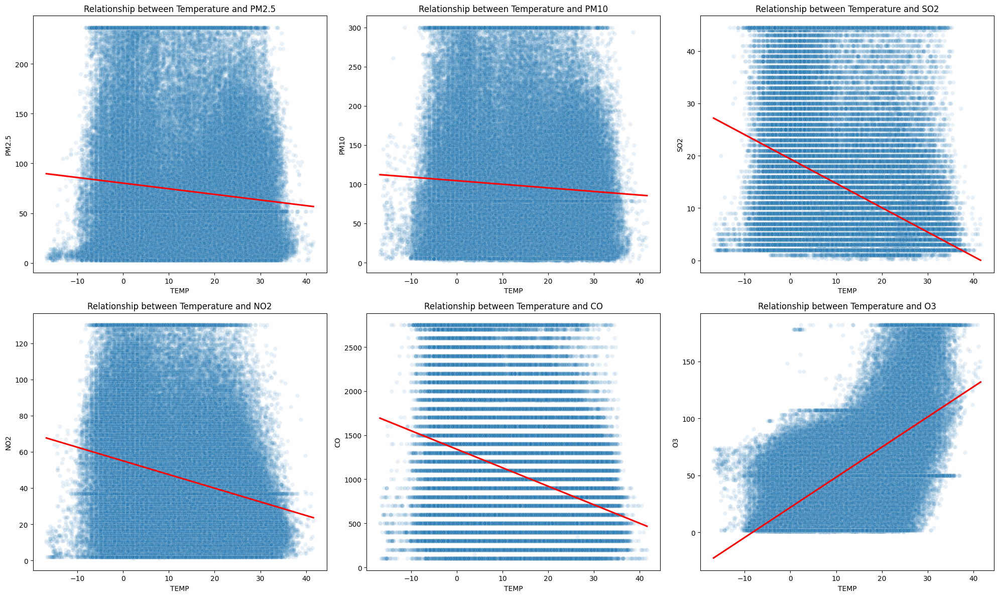

In [78]:
# Relationship between temperature and pollutants
fig, axes = plt.subplots(2, 3, figsize=(20, 12))
axes = axes.flatten()

for i, pollutant in enumerate(pollutants):
    sns.scatterplot(x='TEMP', y=pollutant, data=df, alpha=0.1, ax=axes[i])
    # Add a trend line
    sns.regplot(x='TEMP', y=pollutant, data=df, scatter=False, ax=axes[i], color='red')
    axes[i].set_title(f'Relationship between Temperature and {pollutant}')

plt.tight_layout()
plt.show()

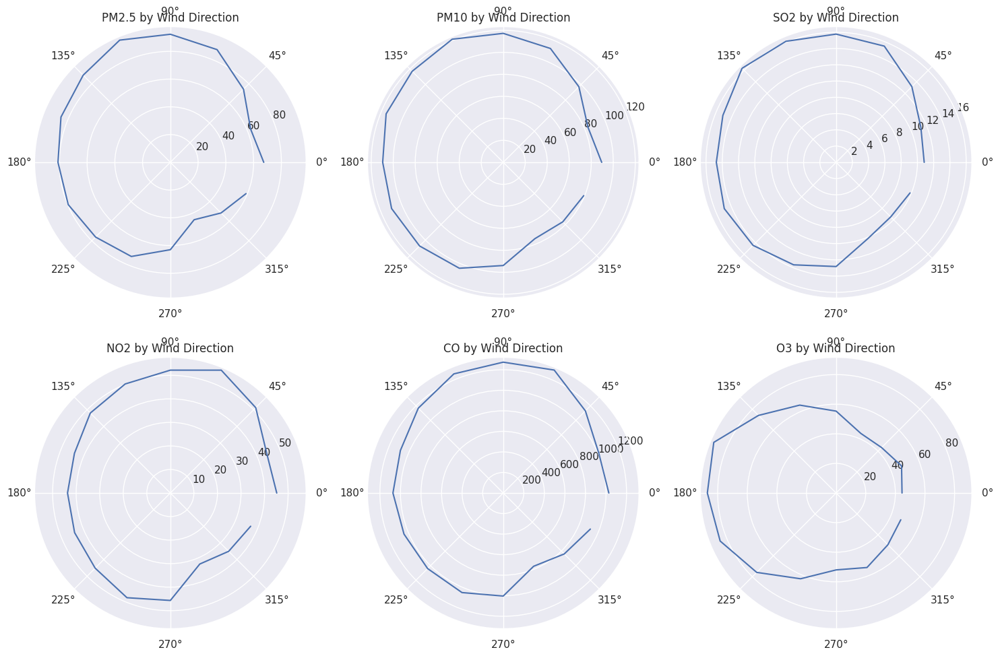

In [ ]:
# Pollutant levels by wind direction
plt.figure(figsize=(15, 10))
for i, pollutant in enumerate(pollutants):
    plt.subplot(2, 3, i+1, polar=True)
    # Group by wind direction and calculate mean
    wind_pollution = df.groupby('wd_numeric')[pollutant].mean().reset_index()
    # Convert to radians for polar plot
    wind_pollution['wd_rad'] = np.radians(wind_pollution['wd_numeric'])
    # Plot
    plt.polar(wind_pollution['wd_rad'], wind_pollution[pollutant])
    plt.title(f'{pollutant} by Wind Direction')

plt.tight_layout()
plt.show()

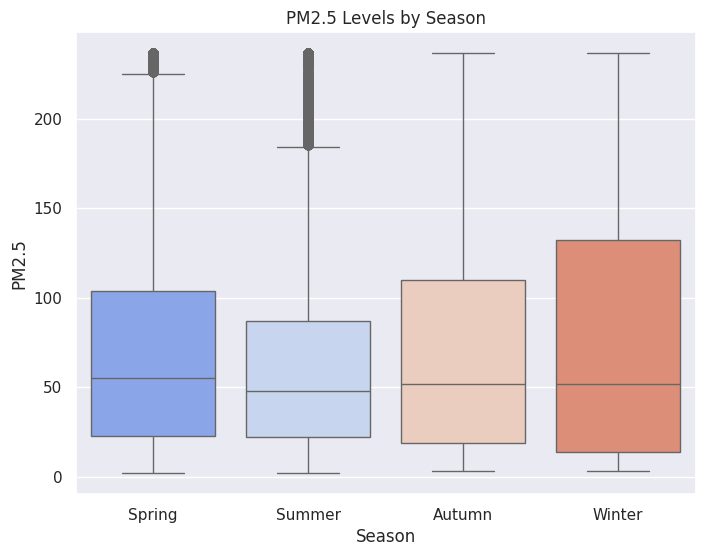

In [ ]:
# Box plot: PM2.5 by season
plt.figure(figsize=(8, 6))
sns.boxplot(x='season', y='PM2.5', data=df, palette='coolwarm')
plt.title('PM2.5 Levels by Season')
plt.xlabel('Season')
plt.ylabel('PM2.5')
plt.show()

# 3. Multivariate Analysis


Seasonal patterns by pollutant

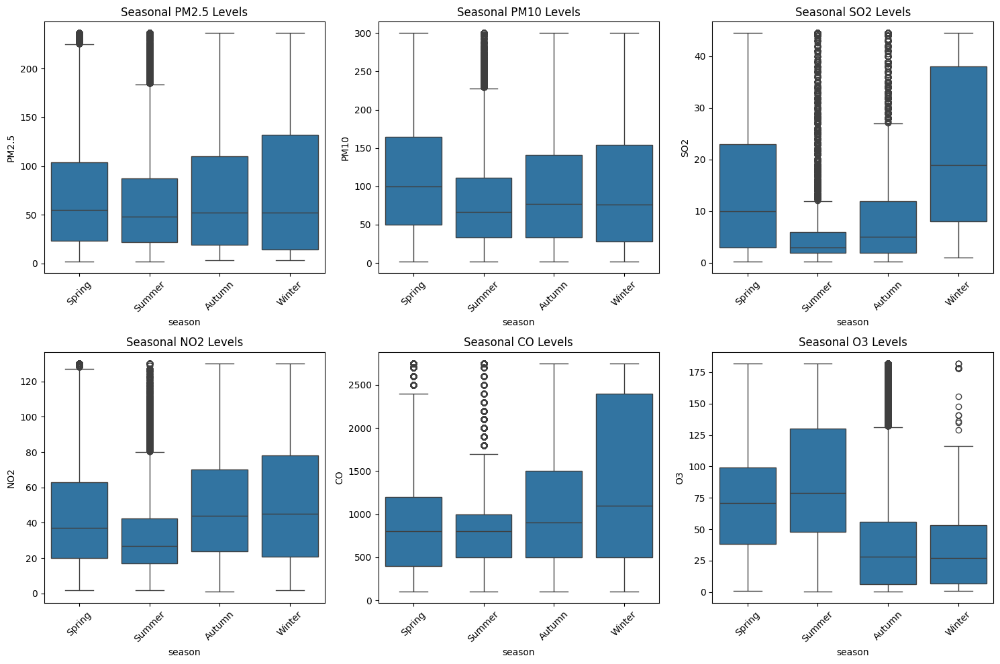

In [ ]:

plt.figure(figsize=(15, 10))
for i, pollutant in enumerate(pollutants):
    plt.subplot(2, 3, i+1)
    sns.boxplot(x='season', y=pollutant, data=df)
    plt.title(f'Seasonal {pollutant} Levels')
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

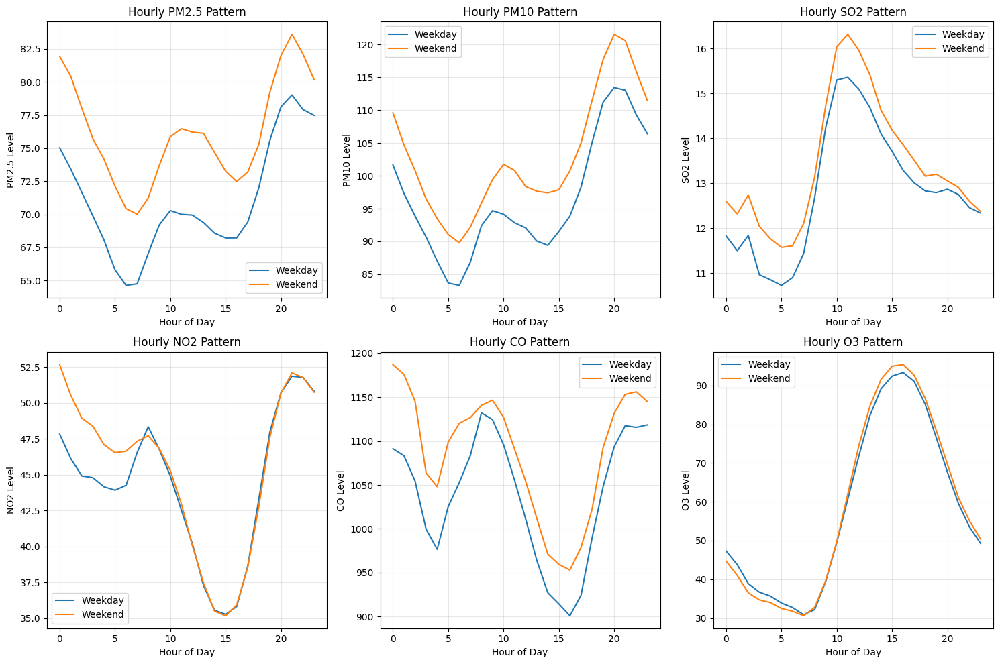

In [ ]:
# Hourly patterns by day type (weekday vs weekend)
daily_pattern = df.groupby(['hour', 'is_weekend'])[pollutants].mean().reset_index()

plt.figure(figsize=(15, 10))
for i, pollutant in enumerate(pollutants):
    plt.subplot(2, 3, i+1)
    for weekend in [0, 1]:
        subset = daily_pattern[daily_pattern['is_weekend'] == weekend]
        label = 'Weekend' if weekend else 'Weekday'
        plt.plot(subset['hour'], subset[pollutant], label=label)
    plt.title(f'Hourly {pollutant} Pattern')
    plt.xlabel('Hour of Day')
    plt.ylabel(f'{pollutant} Level')
    plt.legend()
    plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

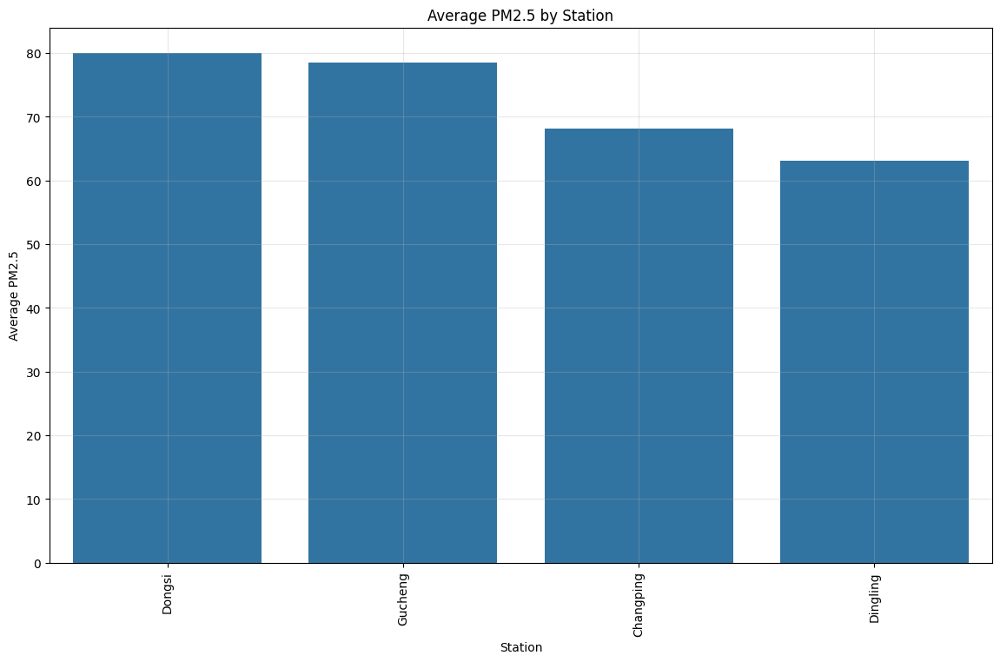

In [ ]:
# Station comparison for PM2.5
station_avg = df.groupby('station')['PM2.5'].mean().sort_values(ascending=False)

plt.figure(figsize=(14, 8))
sns.barplot(x=station_avg.index, y=station_avg.values)
plt.title('Average PM2.5 by Station')
plt.xlabel('Station')
plt.ylabel('Average PM2.5')
plt.xticks(rotation=90)
plt.grid(True, alpha=0.3)
plt.show()

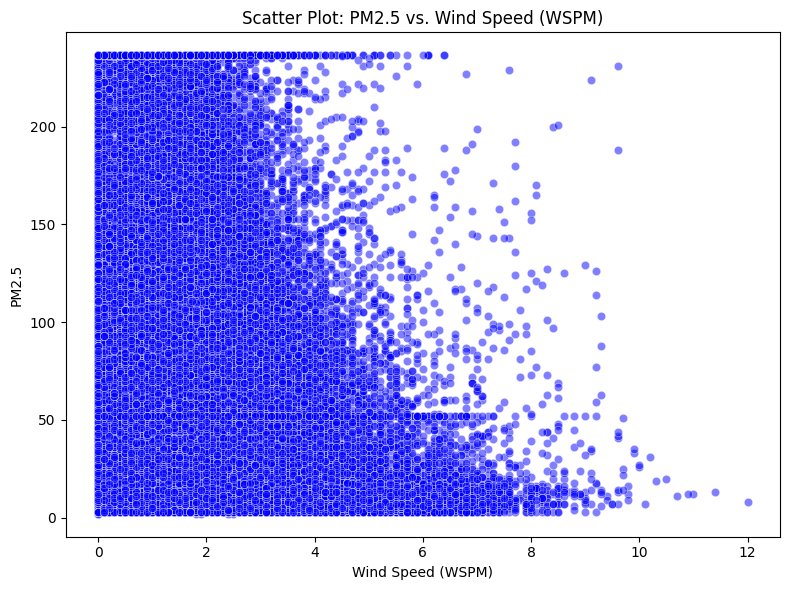

In [ ]:
# Scatter Plot: PM2.5 vs. WSPM (Wind Speed)
plt.figure(figsize=(8, 6))
sns.scatterplot(x='WSPM', y='PM2.5', data=df, alpha=0.5, color='blue')
plt.title('Scatter Plot: PM2.5 vs. Wind Speed (WSPM)')
plt.xlabel('Wind Speed (WSPM)')
plt.ylabel('PM2.5')
plt.tight_layout()
plt.show()


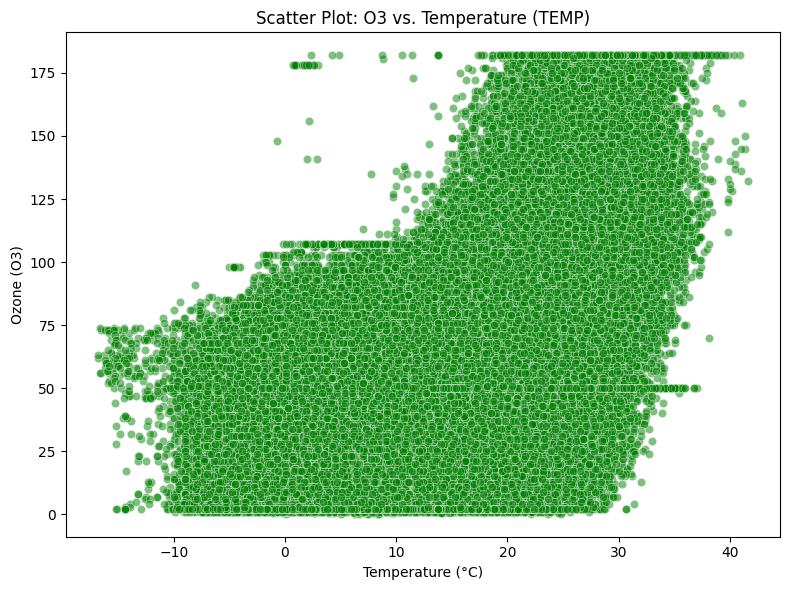

In [ ]:
# Scatter Plot: O3 vs. TEMP (Temperature)
plt.figure(figsize=(8, 6))
sns.scatterplot(x='TEMP', y='O3', data=df, alpha=0.5, color='green')
plt.title('Scatter Plot: O3 vs. Temperature (TEMP)')
plt.xlabel('Temperature (°C)')
plt.ylabel('Ozone (O3)')
plt.tight_layout()
plt.show()


<ipython-input-178-ae122f5ba6cc>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='wind_speed_category', y='PM2.5', data=df, palette='coolwarm')


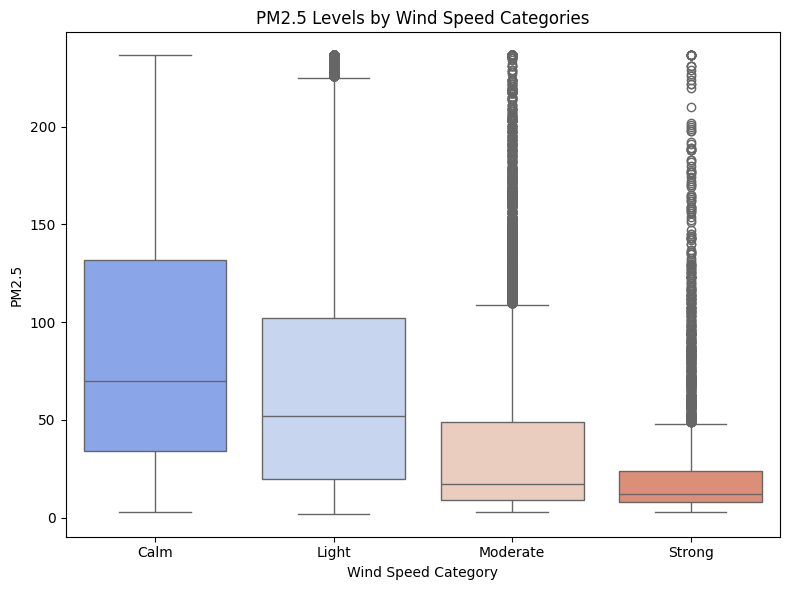

In [ ]:
# Box Plot: PM2.5 Levels by Wind Speed Categories
df['wind_speed_category'] = pd.cut(df['WSPM'], bins=[0, 1, 3, 5, 10], labels=['Calm', 'Light', 'Moderate', 'Strong'])
plt.figure(figsize=(8, 6))
sns.boxplot(x='wind_speed_category', y='PM2.5', data=df, palette='coolwarm')
plt.title('PM2.5 Levels by Wind Speed Categories')
plt.xlabel('Wind Speed Category')
plt.ylabel('PM2.5')
plt.tight_layout()
plt.show()

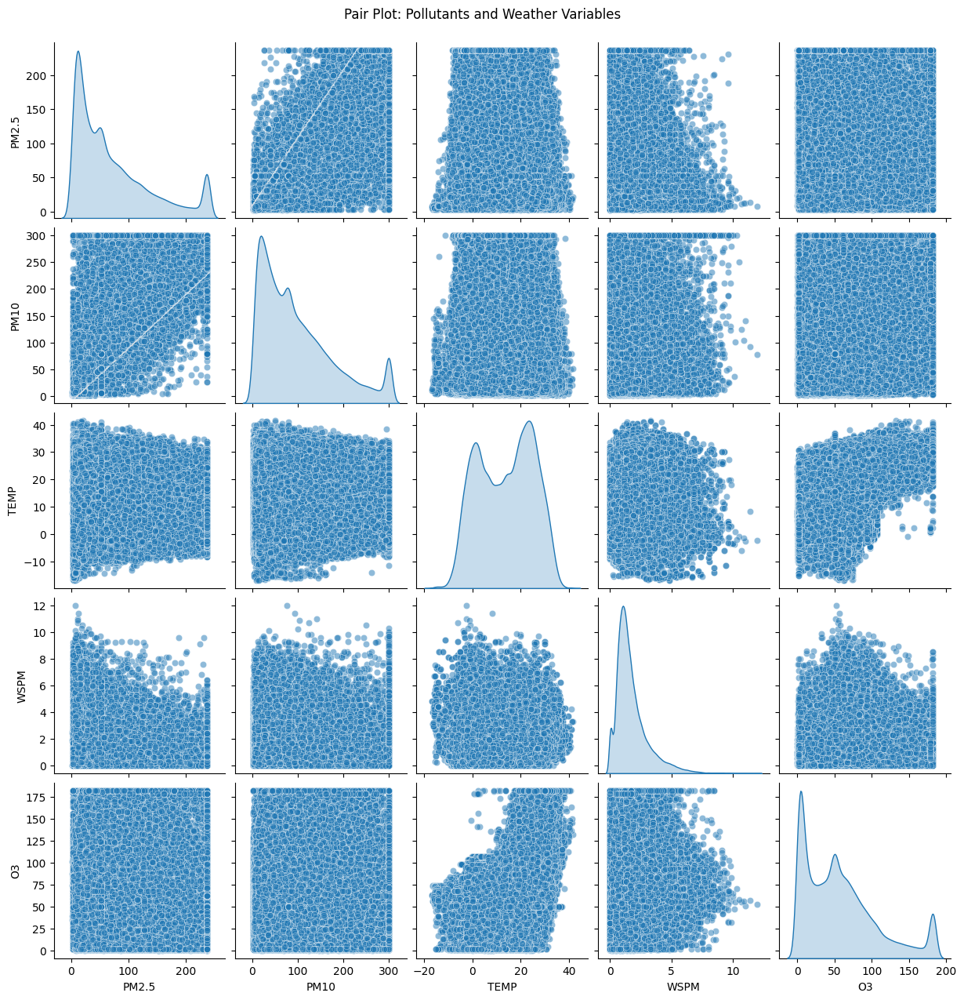

In [ ]:
# Pair Plot: Pollutants and Weather Variables
selected_columns = ['PM2.5', 'PM10', 'TEMP', 'WSPM', 'O3']
sns.pairplot(df[selected_columns], diag_kind='kde', plot_kws={'alpha': 0.5})
plt.suptitle('Pair Plot: Pollutants and Weather Variables', y=1.02)
plt.show()

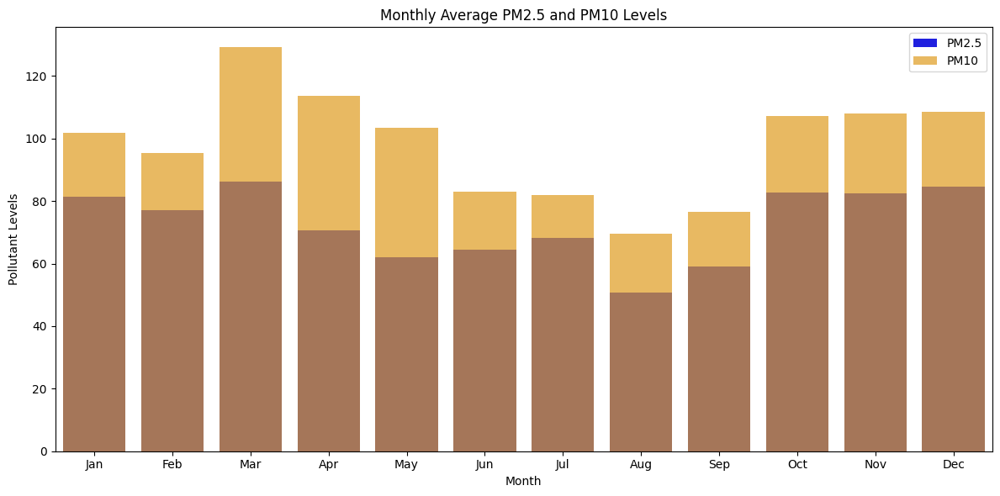

In [ ]:
# Aggregate monthly averages for PM2.5 and PM10
monthly_avg = df.groupby('month')[['PM2.5', 'PM10']].mean().reset_index()

# Plot PM2.5 and PM10 monthly averages
plt.figure(figsize=(12, 6))
sns.barplot(x='month', y='PM2.5', data=monthly_avg, color='blue', label='PM2.5')
sns.barplot(x='month', y='PM10', data=monthly_avg, color='orange', alpha=0.7, label='PM10')
plt.title('Monthly Average PM2.5 and PM10 Levels')
plt.xlabel('Month')
plt.ylabel('Pollutant Levels')
plt.xticks(ticks=range(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.legend()
plt.tight_layout()
plt.show()

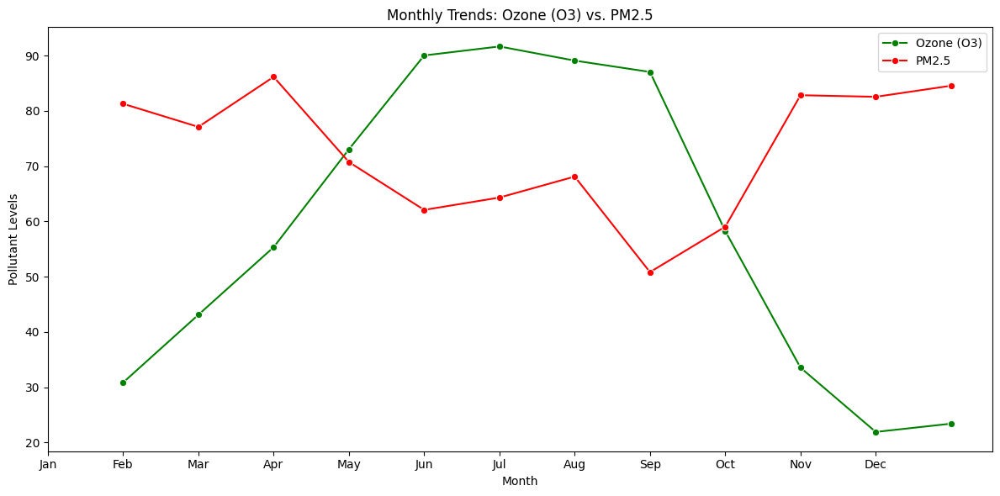

In [ ]:
# Aggregate monthly averages for O3 and PM2.5
monthly_avg_o3_pm25 = df.groupby('month')[['O3', 'PM2.5']].mean().reset_index()

# Line plot for O3 and PM2.5
plt.figure(figsize=(12, 6))
sns.lineplot(x='month', y='O3', data=monthly_avg_o3_pm25, marker='o', label='Ozone (O3)', color='green')
sns.lineplot(x='month', y='PM2.5', data=monthly_avg_o3_pm25, marker='o', label='PM2.5', color='red')
plt.title('Monthly Trends: Ozone (O3) vs. PM2.5')
plt.xlabel('Month')
plt.ylabel('Pollutant Levels')
plt.xticks(ticks=range(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.legend()
plt.tight_layout()
plt.show()

daily trends for each pollutant

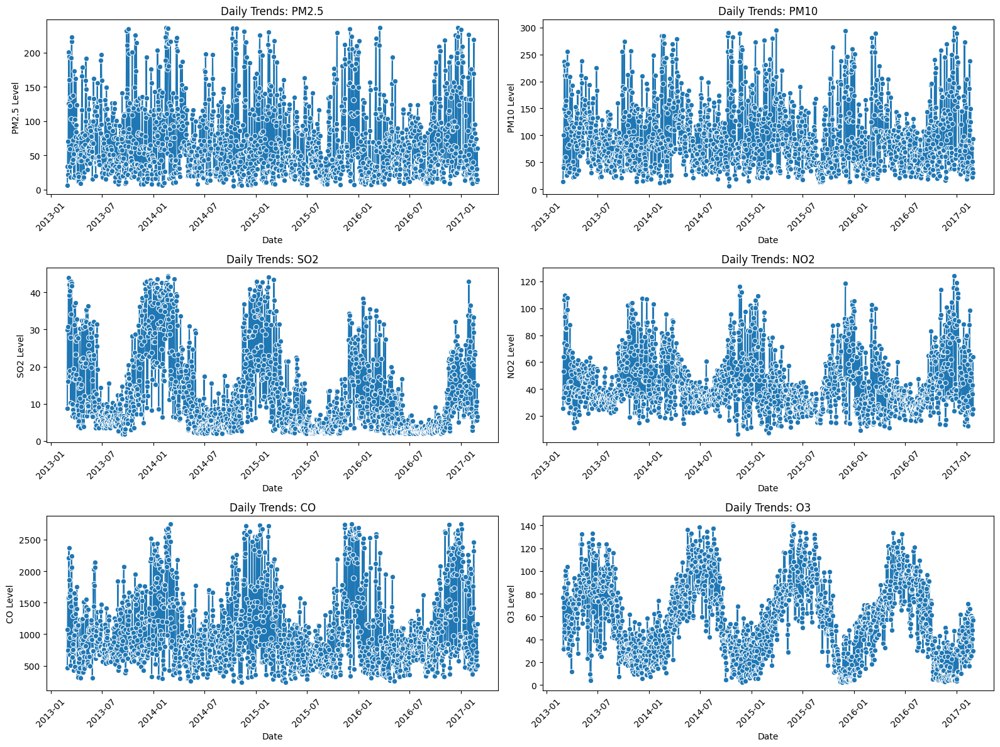

In [ ]:
# Ensure datetime column is in the correct format
df['datetime'] = pd.to_datetime(df['datetime'])

# Create a new column for daily data
df['date'] = df['datetime'].dt.date

# List of pollutants to visualize
pollutants = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3',]

# Aggregate daily averages for pollutants
daily_data = df.groupby('date')[pollutants].mean().reset_index()

# Plot daily trends for each pollutant
plt.figure(figsize=(16, 12))
for i, pollutant in enumerate(pollutants, 1):
    plt.subplot(3, 2, i)  # Create a 3x2 grid of subplots
    sns.lineplot(x='date', y=pollutant, data=daily_data, marker='o')
    plt.title(f'Daily Trends: {pollutant}')
    plt.xlabel('Date')
    plt.ylabel(f'{pollutant} Level')
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

Visualisation of each pollutants (using daily data)

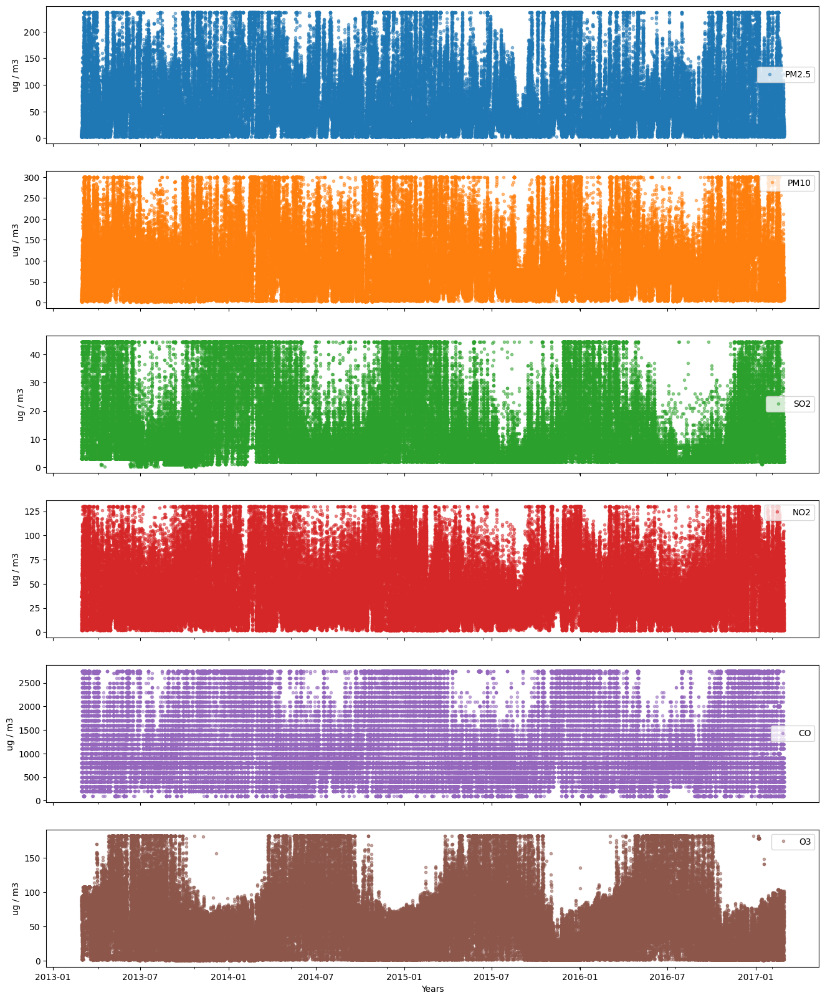

In [ ]:
df.set_index('date',inplace=True)
axes = df[pollutants].plot(marker='.', alpha=0.5, linestyle='None', figsize=(16, 20), subplots=True)
for ax in axes:

    ax.set_xlabel('Years')
    ax.set_ylabel('ug / m3')

In [ ]:
print(df.columns)

Index(['No', 'year', 'month', 'day', 'hour', 'PM2.5', 'PM10', 'SO2', 'NO2',
       'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'wd', 'WSPM', 'station',
       'datetime', 'season', 'day_of_week', 'is_weekend', 'year_month',
       'hour_of_day', 'pollution_category', 'wd_numeric',
       'wind_speed_category', 'PM2.5_TEMP_interaction',
       'PM10_WSPM_interaction', 'RAIN_PM2.5_interaction'],
      dtype='object')


Monthwise Plot

In [ ]:
import pandas as pd
import plotly.graph_objects as go

# Assuming your DataFrame is already loaded as 'df'
# Ensure 'datetime' column is in datetime format
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')

# Define pollutant columns
pollutant_columns = ['PM2.5', 'PM10', 'SO2', 'NO2', 'O3']

# Group data by 'year_month' column (already exists in your DataFrame)
df_monthly = df.groupby('year_month')[pollutant_columns].mean().reset_index()

# Create a Plotly figure
fig = go.Figure()

# Add a line plot for each pollutant
for pollutant in pollutant_columns:
    fig.add_trace(
        go.Scatter(
            x=df_monthly['year_month'].astype(str),  # Convert to string for x-axis
            y=df_monthly[pollutant],
            mode='lines+markers',  # Line and marker style
            name=pollutant  # Legend entry
        )
    )

# Update layout for better readability
fig.update_layout(
    title="Month-wise Pollutant Levels",
    xaxis_title="Month",
    yaxis_title="Pollutant Concentration (µg/m³)",
    height=600,
    showlegend=True,
    template="plotly"
)

# Show the plot
fig.show()

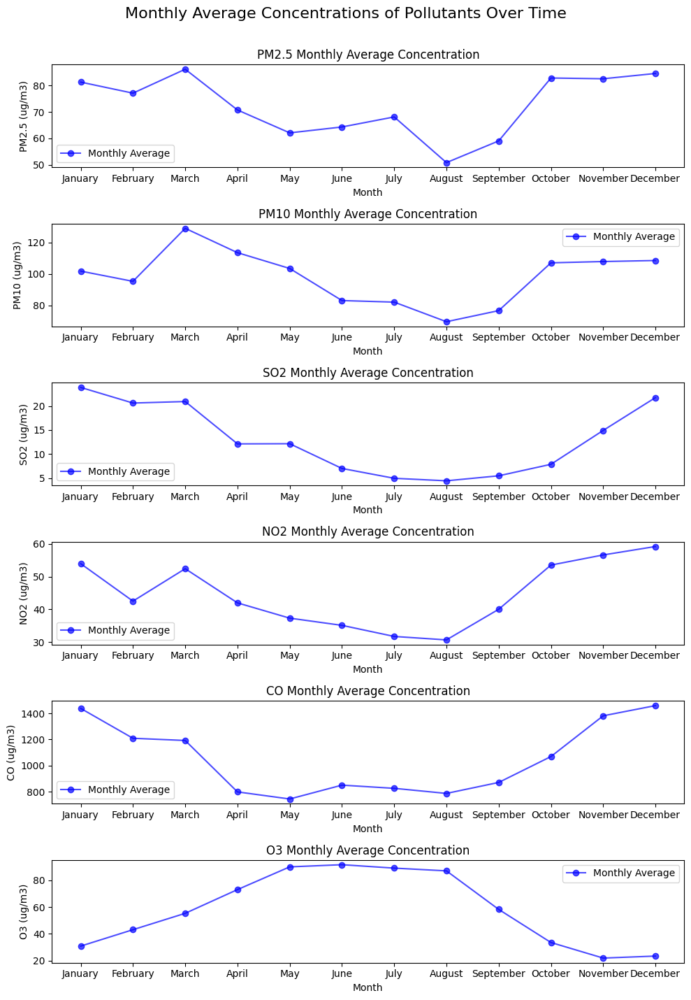

In [ ]:
# Group by Month to calculate the monthly average for each pollutant
monthly_avg = df.groupby('month')[pollutants].mean()

# Plotting the monthly average for each pollutant
fig, axes = plt.subplots(len(pollutants), 1, figsize=(10, 15), sharex=False)

# Define month names for x-axis labels
month_names = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

for i, pollutant in enumerate(pollutants):
    ax = axes[i]
    ax.plot(month_names, monthly_avg[pollutant], marker='o', linestyle='-', color='blue', alpha=0.7, label='Monthly Average')
    ax.set_ylabel(f'{pollutant} (ug/m3)')
    ax.set_title(f'{pollutant} Monthly Average Concentration')
    ax.legend()
    ax.set_xlabel('Month')  # Set x-axis label

# Adjust spacing between subplots
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Set a common title for the figure
fig.suptitle('Monthly Average Concentrations of Pollutants Over Time', fontsize=16)

plt.show()

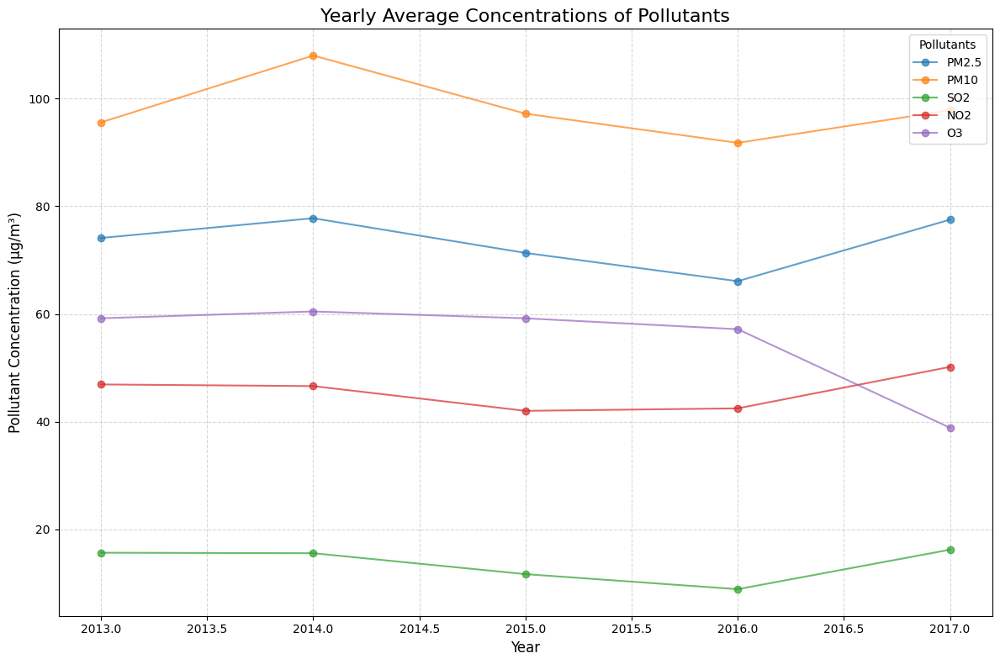

In [ ]:

# Ensure 'datetime' column is in datetime format
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')

# Extract the Year from the datetime column
df['Year'] = df['datetime'].dt.year

# Define the pollutants for analysis
pollutants = ['PM2.5', 'PM10', 'SO2', 'NO2', 'O3']

# Group by Year to calculate yearly averages for each pollutant
yearly_avg = df.groupby('Year')[pollutants].mean()

# Plot the yearly average for each pollutant
fig, ax = plt.subplots(figsize=(12, 8))

# Line plot for each pollutant
for pollutant in pollutants:
    ax.plot(
        yearly_avg.index, yearly_avg[pollutant],
        marker='o', linestyle='-', label=pollutant, alpha=0.7
    )

# Add labels, title, and legend
ax.set_title("Yearly Average Concentrations of Pollutants", fontsize=16)
ax.set_xlabel("Year", fontsize=12)
ax.set_ylabel("Pollutant Concentration (µg/m³)", fontsize=12)
ax.legend(title="Pollutants")
ax.grid(True, linestyle='--', alpha=0.5)

# Show the plot
plt.tight_layout()
plt.show()

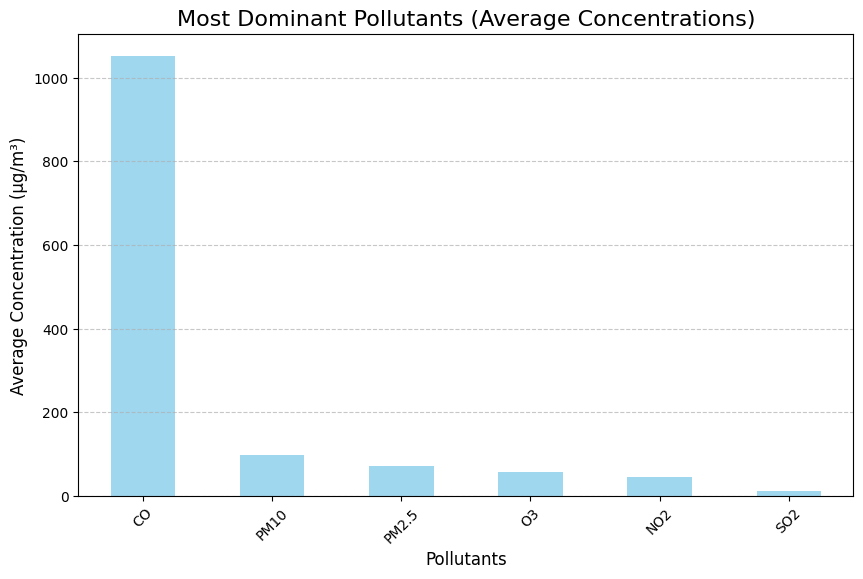

In [ ]:


# Define the pollutants for analysis
pollutants = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3']

# Calculate the overall average concentration for each pollutant
average_concentrations = df[pollutants].mean()

# Sort pollutants by their average concentrations in descending order
average_concentrations = average_concentrations.sort_values(ascending=False)

# Plot the average concentrations to visualize the dominant pollutants
plt.figure(figsize=(10, 6))
average_concentrations.plot(kind='bar', color='skyblue', alpha=0.8)
plt.title('Most Dominant Pollutants (Average Concentrations)', fontsize=16)
plt.ylabel('Average Concentration (µg/m³)', fontsize=12)
plt.xlabel('Pollutants', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

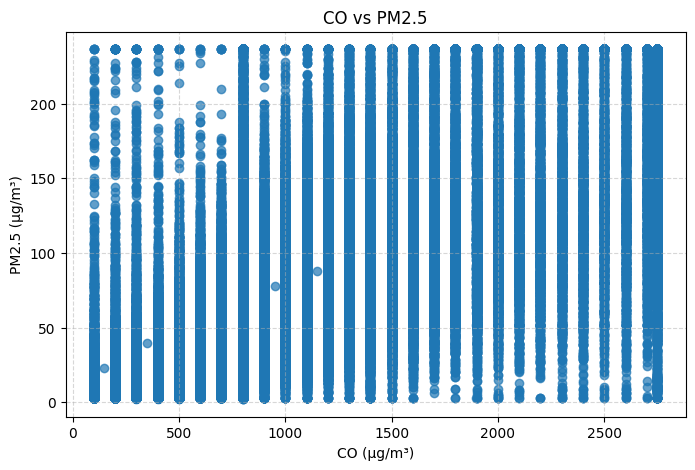

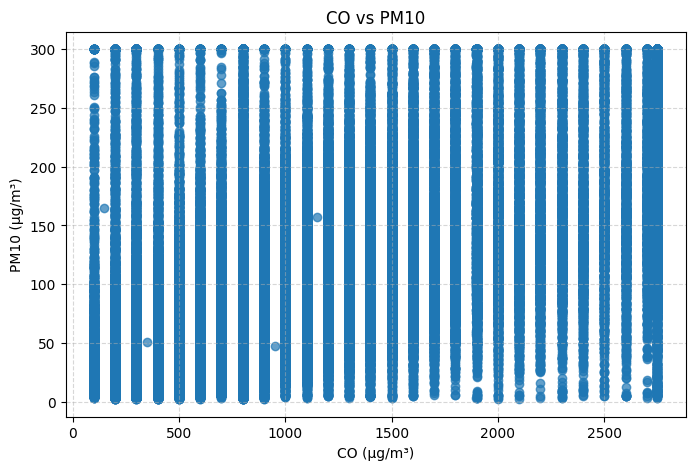

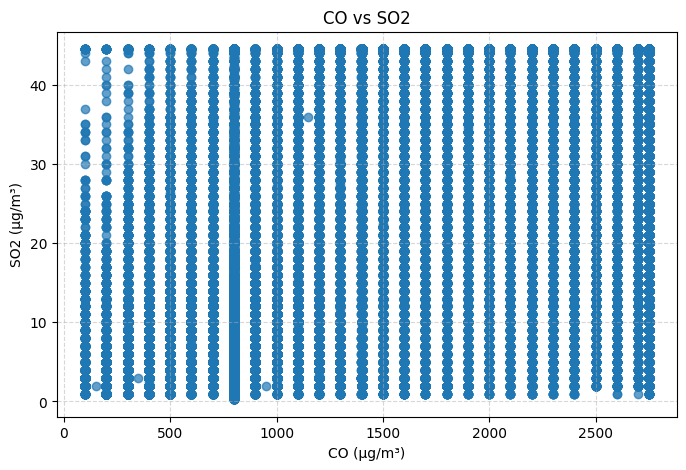

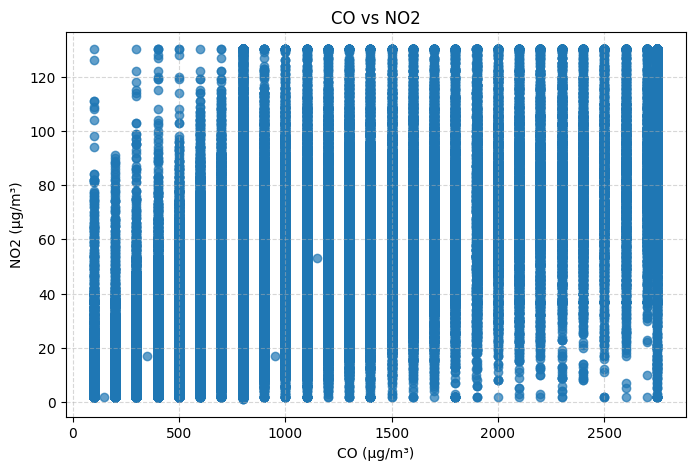

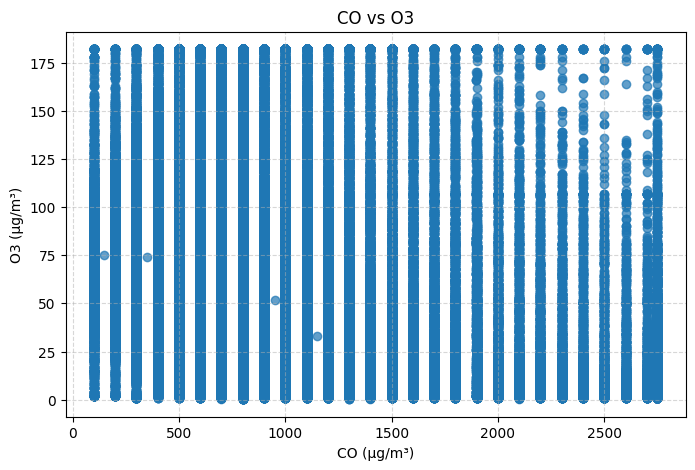

Descriptive statistics for CO:
count    140256.000000
mean       1051.820892
std         753.469210
min         100.000000
25%         500.000000
50%         800.000000
75%        1400.000000
max        2750.000000
Name: CO, dtype: float64
Number of CO outliers: 0


In [ ]:

# Define pollutants
pollutants = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3']

# Plot CO against other pollutants
for pollutant in pollutants:
    if pollutant != 'CO':
        plt.figure(figsize=(8, 5))
        plt.scatter(df['CO'], df[pollutant], alpha=0.7)
        plt.title(f'CO vs {pollutant}')
        plt.xlabel('CO (µg/m³)')
        plt.ylabel(f'{pollutant} (µg/m³)')
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.show()

# Check for anomalies in CO data
print("Descriptive statistics for CO:")
print(df['CO'].describe())

# Detect outliers using IQR
Q1 = df['CO'].quantile(0.25)
Q3 = df['CO'].quantile(0.75)
IQR = Q3 - Q1
outliers = df[(df['CO'] < (Q1 - 1.5 * IQR)) | (df['CO'] > (Q3 + 1.5 * IQR))]
print(f"Number of CO outliers: {len(outliers)}")

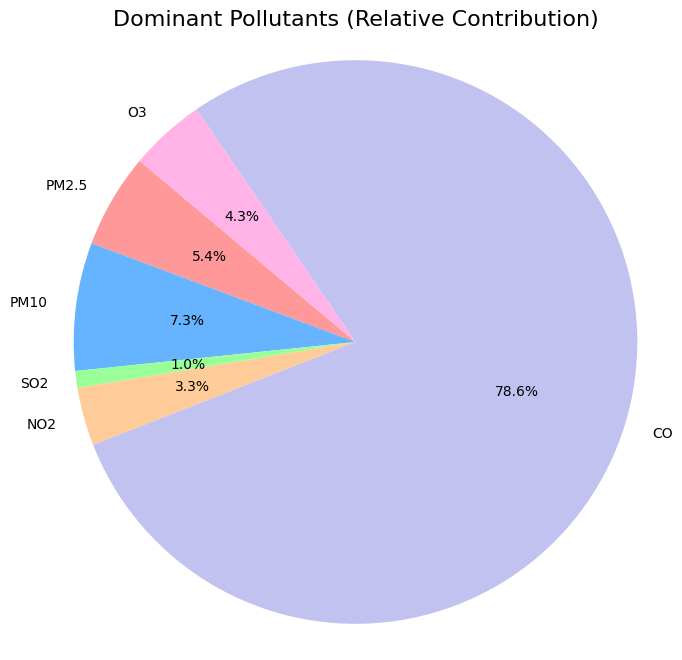

In [ ]:


# Define the pollutant columns
pollutants = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3']

# Calculate the overall average concentration for each pollutant
average_concentrations = df[pollutants].mean()

# Plot the pie chart
plt.figure(figsize=(8, 8))
plt.pie(
    average_concentrations,
    labels=average_concentrations.index,
    autopct='%1.1f%%',
    startangle=140,
    colors=['#ff9999','#66b3ff','#99ff99','#ffcc99','#c2c2f0','#ffb3e6']
)
plt.title('Dominant Pollutants (Relative Contribution)', fontsize=16)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.show()

In [ ]:
# Statistical and Summary Insights
# ---------------------------------------

# Statistical summary of pollutants
print("Statistical Summary of Pollutants:")
print(df[pollutant_columns].describe())

# Count of pollution categories
pollution_counts = df['pollution_category'].value_counts()
print("\nPollution Categories (Count):")
print(pollution_counts)


Statistical Summary of Pollutants:
               PM2.5           PM10            SO2            NO2  \
count  140256.000000  140256.000000  140256.000000  140256.000000   
mean       72.472980      98.235829      12.984795      44.640966   
std        65.679197      78.076058      13.575761      31.734036   
min         2.000000       2.000000       0.285600       1.026500   
25%        19.000000      35.000000       2.000000      19.914100   
50%        52.000000      79.000000       7.000000      37.000000   
75%       106.000000     141.000000      19.000000      64.000000   
max       236.500000     300.000000      44.500000     130.128850   

                  O3  
count  140256.000000  
mean       58.196252  
std        48.858372  
min         0.214200  
25%        17.000000  
50%        50.000000  
75%        83.000000  
max       182.000000  

Pollution Categories (Count):
pollution_category
Good                              67755
Moderate                          35105
Unheal

In [ ]:
df.columns

Index(['No', 'year', 'month', 'day', 'hour', 'PM2.5', 'PM10', 'SO2', 'NO2',
       'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'wd', 'WSPM', 'station',
       'datetime', 'season', 'day_of_week', 'is_weekend', 'year_month',
       'hour_of_day', 'pollution_category', 'wd_numeric',
       'wind_speed_category', 'PM2.5_TEMP_interaction',
       'PM10_WSPM_interaction', 'RAIN_PM2.5_interaction', 'Year'],
      dtype='object')

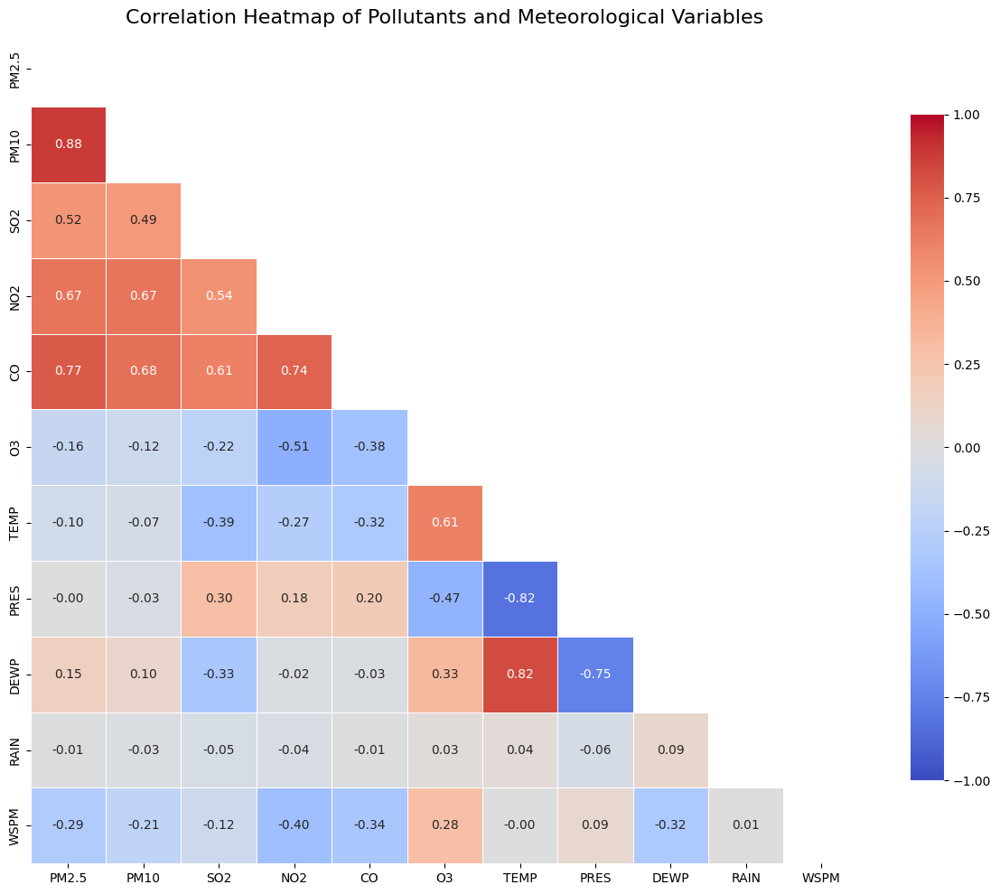

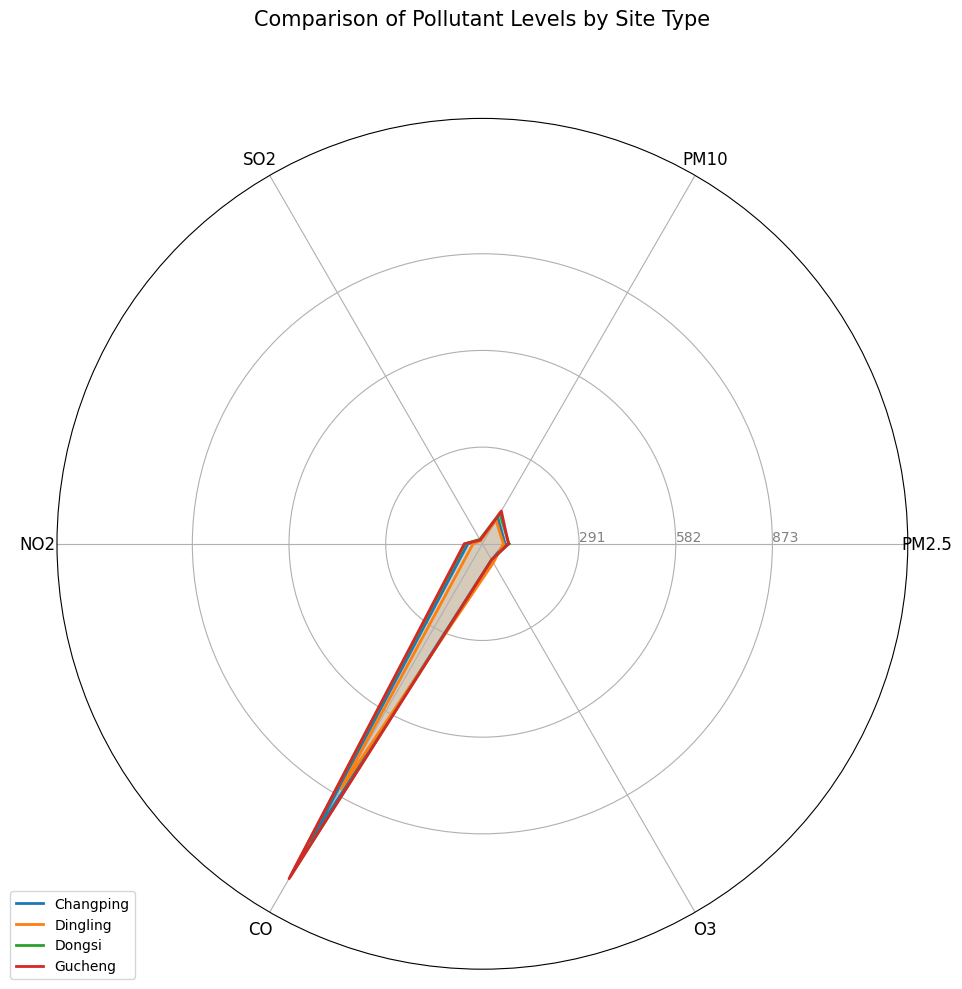

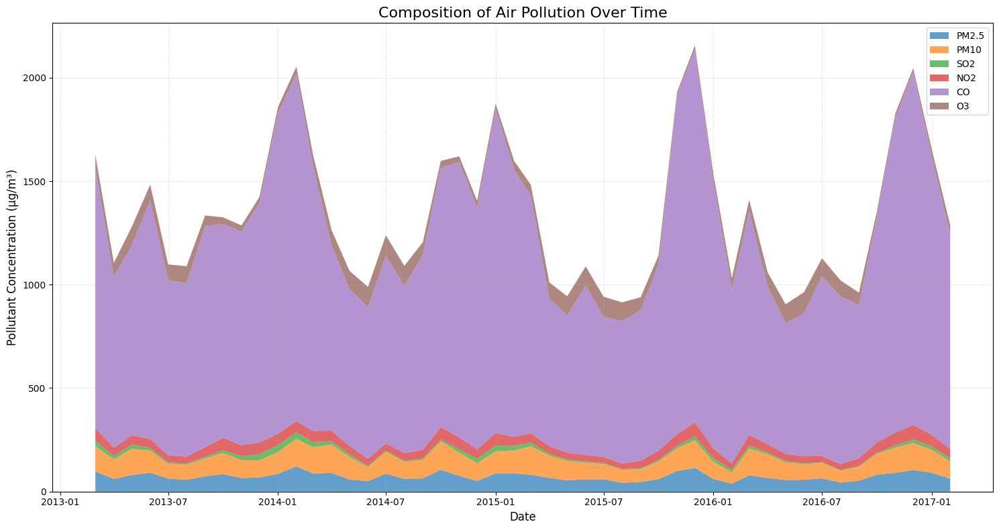

In [ ]:
# 1. Correlation Heatmap
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Select relevant columns for correlation analysis
correlation_columns = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM']

# Calculate the correlation matrix
correlation_matrix = df[correlation_columns].corr()

# Create a mask for the upper triangle
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Set up the matplotlib figure
plt.figure(figsize=(12, 10))

# Create the heatmap
sns.heatmap(correlation_matrix, mask=mask, annot=True, fmt=".2f", cmap="coolwarm",
            linewidths=0.5, vmin=-1, vmax=1, cbar_kws={"shrink": .8})

plt.title('Correlation Heatmap of Pollutants and Meteorological Variables', fontsize=16)
plt.tight_layout()
plt.show()

# 2. Radar Chart for Site Type Comparison
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.path import Path
from matplotlib.spines import Spine
from matplotlib.transforms import Affine2D

# Group data by site type and calculate mean values for each pollutant
site_comparison = df.groupby('station')[pollutants].mean()

# Function to create a radar chart
def radar_chart(df, title):
    # Number of variables
    categories = list(df.columns)
    N = len(categories)

    # What will be the angle of each axis in the plot (divide the plot / number of variables)
    angles = [n / float(N) * 2 * np.pi for n in range(N)]
    angles += angles[:1]  # Close the loop

    # Initialize the spider plot
    fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(polar=True))

    # Draw one axis per variable and add labels
    plt.xticks(angles[:-1], categories, size=12)

    # Draw the y-axis labels (0-100%)
    ax.set_rlabel_position(0)
    max_values = df.max().max()
    plt.yticks([max_values*0.25, max_values*0.5, max_values*0.75],
               [f"{int(max_values*0.25)}", f"{int(max_values*0.5)}", f"{int(max_values*0.75)}"],
               color="grey", size=10)
    plt.ylim(0, max_values*1.1)

    # Plot each site type
    for idx, site in enumerate(df.index):
        values = df.loc[site].values.tolist()
        values += values[:1]  # Close the loop
        ax.plot(angles, values, linewidth=2, linestyle='solid', label=site)
        ax.fill(angles, values, alpha=0.1)

    # Add legend
    plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))

    plt.title(title, size=15, y=1.1)
    return fig, ax

# Create the radar chart
radar_chart(site_comparison, 'Comparison of Pollutant Levels by Site Type')
plt.tight_layout()
plt.show()

# 3. Stacked Area Chart for Pollution Composition Over Time
# First, aggregate data by month for plotting
monthly_data = df.groupby('year_month')[pollutants].mean().reset_index()

# Convert year_month to datetime for better plotting
monthly_data['date'] = pd.to_datetime(monthly_data['year_month'].astype(str))
monthly_data = monthly_data.sort_values('date')

# Create the stacked area chart
plt.figure(figsize=(15, 8))
plt.stackplot(monthly_data['date'],
              [monthly_data[pollutant] for pollutant in pollutants],
              labels=pollutants, alpha=0.7)

plt.title('Composition of Air Pollution Over Time', fontsize=16)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Pollutant Concentration (µg/m³)', fontsize=12)
plt.legend(loc='upper right')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()



#AQI calculation

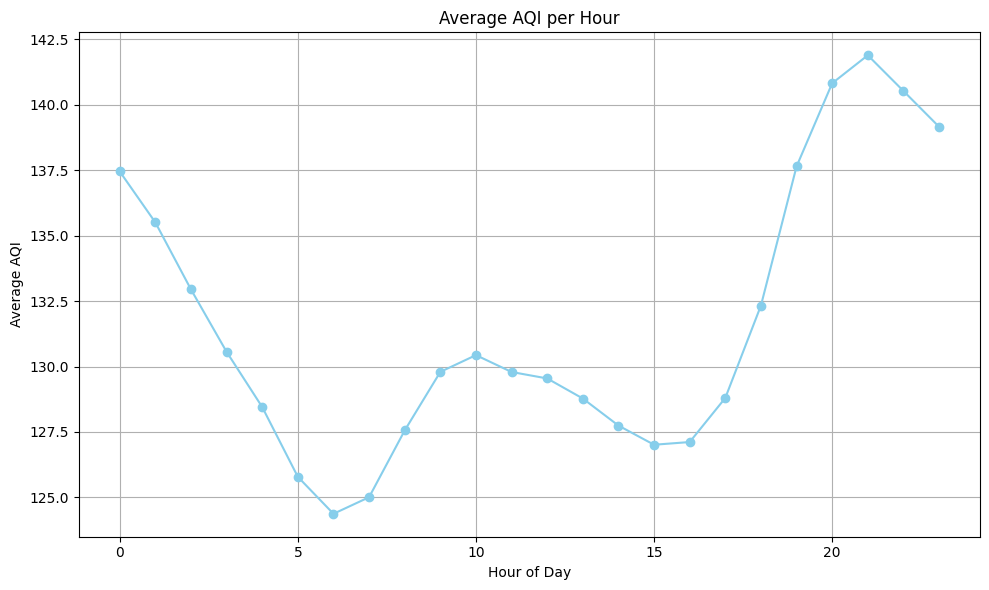

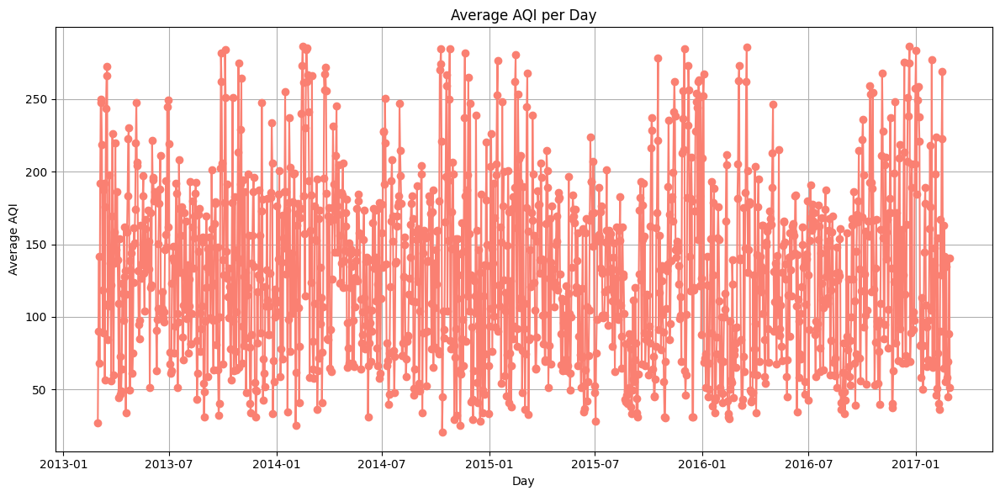

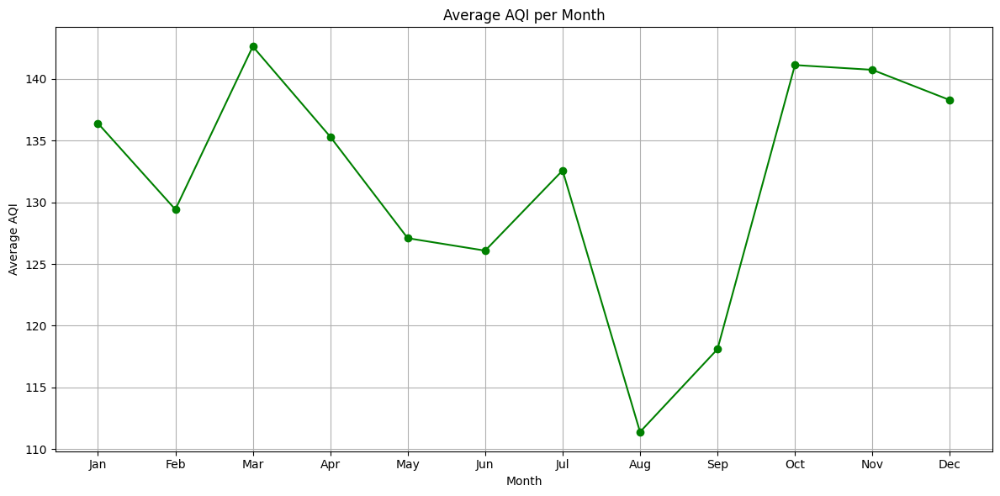

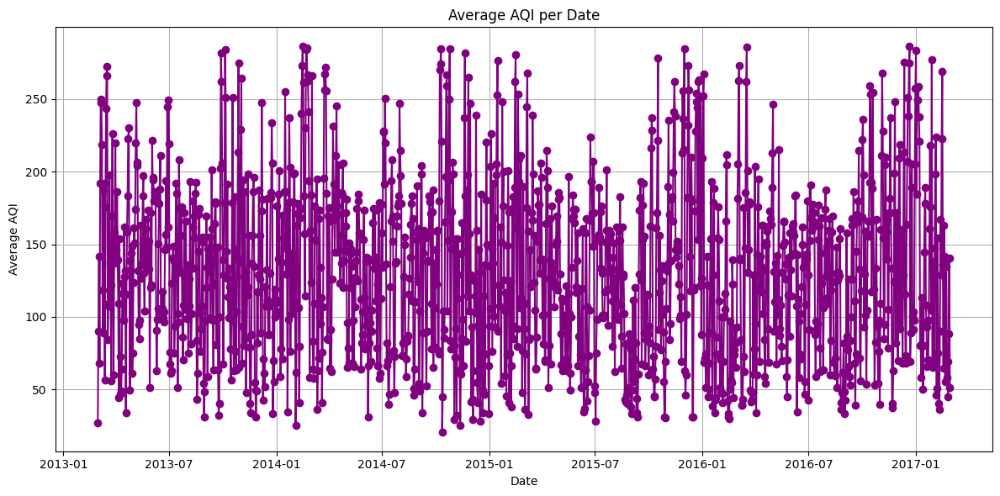

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Define the AQI calculation function for PM2.5 (you can extend it to other pollutants)
def calculate_aqi(pollutant_concentration, low_breakpoint, high_breakpoint, low_aqi, high_aqi):
    aqi = ((high_aqi - low_aqi) / (high_breakpoint - low_breakpoint)) * (pollutant_concentration - low_breakpoint) + low_aqi
    return aqi

# Assuming 'df' has columns for pollutants like 'PM2.5', 'datetime', etc.
# We will use PM2.5 as an example for AQI calculation

# Define AQI breakpoints for PM2.5 (You can refer to your country's AQI breakpoints here)
pm25_breakpoints = {
    (0, 12): (0, 50),      # Good
    (12.1, 35.4): (51, 100),  # Moderate
    (35.5, 55.4): (101, 150), # Unhealthy for sensitive groups
    (55.5, 150.4): (151, 200), # Unhealthy
    (150.5, 250.4): (201, 300), # Very Unhealthy
    (250.5, 500): (301, 500)   # Hazardous
}

# Calculate AQI for PM2.5
def calculate_pm25_aqi(pm25_concentration):
    for (low, high), (low_aqi, high_aqi) in pm25_breakpoints.items():
        if low <= pm25_concentration <= high:
            return calculate_aqi(pm25_concentration, low, high, low_aqi, high_aqi)
    return None

# Apply the AQI calculation function
df['AQI'] = df['PM2.5'].apply(calculate_pm25_aqi)

# Convert 'datetime' to pandas datetime format if not already done
df['datetime'] = pd.to_datetime(df['datetime'])

# Extract different time components for aggregation
df['hour'] = df['datetime'].dt.hour
df['day'] = df['datetime'].dt.date
df['month'] = df['datetime'].dt.month
df['date'] = df['datetime'].dt.date

# 1. AQI per Hour
hourly_aqi = df.groupby('hour')['AQI'].mean()

# Plot AQI per Hour
plt.figure(figsize=(10, 6))
hourly_aqi.plot(kind='line', marker='o', color='skyblue')
plt.title('Average AQI per Hour')
plt.xlabel('Hour of Day')
plt.ylabel('Average AQI')
plt.grid(True)
plt.tight_layout()
plt.show()

# 2. AQI per Day
daily_aqi = df.groupby('day')['AQI'].mean()

# Plot AQI per Day
plt.figure(figsize=(12, 6))
daily_aqi.plot(kind='line', marker='o', color='salmon')
plt.title('Average AQI per Day')
plt.xlabel('Day')
plt.ylabel('Average AQI')
plt.grid(True)
plt.tight_layout()
plt.show()

# 3. AQI per Month
monthly_aqi = df.groupby('month')['AQI'].mean()

# Plot AQI per Month
plt.figure(figsize=(12, 6))
monthly_aqi.plot(kind='line', marker='o', color='green')
plt.title('Average AQI per Month')
plt.xlabel('Month')
plt.ylabel('Average AQI')
plt.grid(True)
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.tight_layout()
plt.show()

# Reset index without adding the 'date' column back into the DataFrame
df = df.reset_index(drop=True)

# 4. AQI per Date
date_aqi = df.groupby('date')['AQI'].mean()

# Plot AQI per Date
plt.figure(figsize=(12, 6))
date_aqi.plot(kind='line', marker='o', color='purple')
plt.title('Average AQI per Date')
plt.xlabel('Date')
plt.ylabel('Average AQI')
plt.grid(True)
plt.tight_layout()
plt.show()




check data in there is any missinge value

In [ ]:
df.isnull().sum()

,0
No,0
year,0
month,0
day,0
hour,0
PM2.5,0
PM10,0
SO2,0
NO2,0
CO,0


In [ ]:
# Fill missing values (wind_speed_category) in categorical column with mode
df['wind_speed_category'].fillna(df['wind_speed_category'].mode()[0], inplace=True)



<ipython-input-196-cc1608647238>:2: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [ ]:
df.isnull().sum()

,0
No,0
year,0
month,0
day,0
hour,0
PM2.5,0
PM10,0
SO2,0
NO2,0
CO,0


### Task 3: Check the correlation of Evapotranspiration with all the other variables one by one. In another words, Evapotranspiration is the output of interest here and all other variables are considered to be contributing variables.

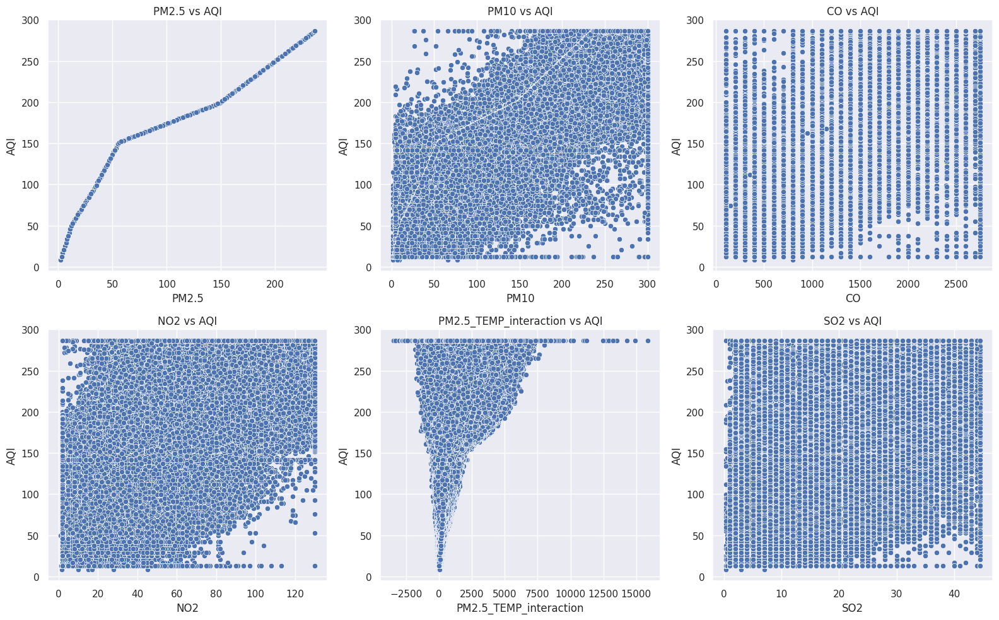

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set seaborn plotting aesthetics as default
sns.set()

# Step 1: Select numerical features and remove AQI
numerical_features = df.select_dtypes(include='number').columns.tolist()
numerical_features.remove('AQI')

# Step 2: Calculate correlation with AQI
correlations = df[numerical_features + ['AQI']].corr()['AQI'].drop('AQI').sort_values(ascending=False)

# Step 3: Get top 6 most positively correlated features with AQI
top_corr_features = correlations.head(6).index.tolist()

# Step 4: Create subplots
figure, axes = plt.subplots(2, 3, figsize=(16, 10))

# Step 5: Create scatterplots in each subplot
sns.scatterplot(data=df, x=top_corr_features[0], y='AQI', ax=axes[0, 0])
sns.scatterplot(data=df, x=top_corr_features[1], y='AQI', ax=axes[0, 1])
sns.scatterplot(data=df, x=top_corr_features[2], y='AQI', ax=axes[0, 2])
sns.scatterplot(data=df, x=top_corr_features[3], y='AQI', ax=axes[1, 0])
sns.scatterplot(data=df, x=top_corr_features[4], y='AQI', ax=axes[1, 1])
sns.scatterplot(data=df, x=top_corr_features[5], y='AQI', ax=axes[1, 2])

# Set plot titles for clarity
axes[0, 0].set_title(f'{top_corr_features[0]} vs AQI')
axes[0, 1].set_title(f'{top_corr_features[1]} vs AQI')
axes[0, 2].set_title(f'{top_corr_features[2]} vs AQI')
axes[1, 0].set_title(f'{top_corr_features[3]} vs AQI')
axes[1, 1].set_title(f'{top_corr_features[4]} vs AQI')
axes[1, 2].set_title(f'{top_corr_features[5]} vs AQI')

plt.tight_layout()
plt.show()


df.c


Linear Regression Results:
Mean Absolute Error: 15.290726014205518
Mean Squared Error: 356.7270851398252
R² Score: 0.9328980239447571
------------------------------
KNN Results:
Mean Absolute Error: 10.992066901870842
Mean Squared Error: 244.8511163443135
R² Score: 0.9539423990202605
------------------------------
SVM Results:
Mean Absolute Error: 5.5851014903852
Mean Squared Error: 83.97846400137887
R² Score: 0.9842032715896304
------------------------------
Decision Tree Results:
Mean Absolute Error: 8.560895576889049e-05
Mean Squared Error: 3.805017645730631e-05
R² Score: 0.9999999928425899
------------------------------
Random Forest Results:
Mean Absolute Error: 7.708901624351353e-05
Mean Squared Error: 3.233877432541793e-05
R² Score: 0.9999999939169305
------------------------------

Model Comparison:
                         MAE         MSE        R²
Linear Regression  15.290726  356.727085  0.932898
KNN                10.992067  244.851116  0.953942
SVM                 5.585101

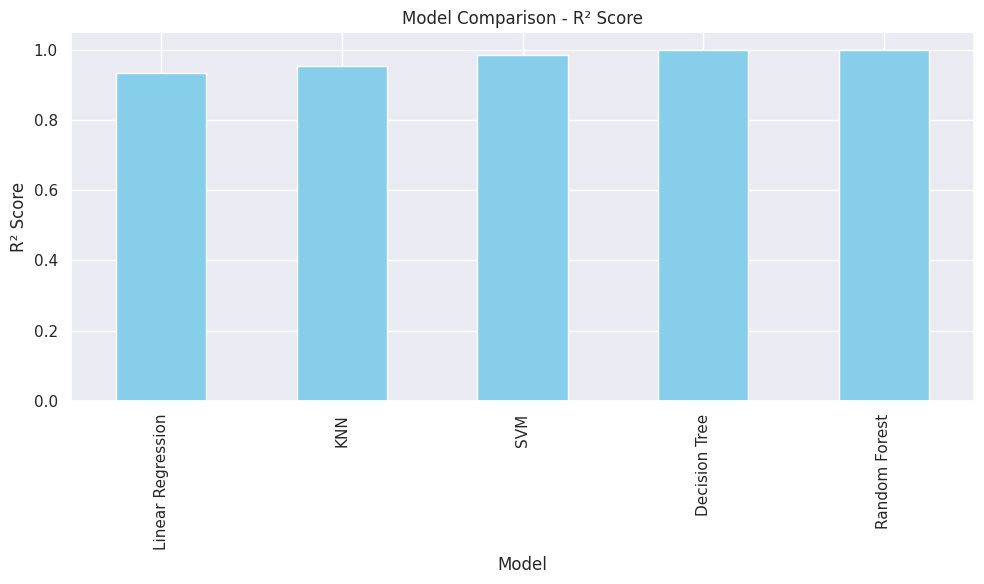

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt

# # Load the dataset
# df = pd.read_csv("/content/drive/MyDrive/assessment.st20313571/combined_output.csv")  # Replace 'your_/content/drive/MyDrive/assessment.st20313571/combined_output.csvdataset.csv' with your actual dataset

# Feature Selection
features = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN',
            'WSPM', 'PM2.5_TEMP_interaction', 'PM10_WSPM_interaction', 'RAIN_PM2.5_interaction',
            'wd', 'season', 'is_weekend', 'wind_speed_category']
target = 'AQI'

# Splitting the dataset into features and target
X = df[features]
y = df[target]

# Encoding categorical variables
categorical_features = ['wd', 'season', 'wind_speed_category']
numerical_features = [col for col in features if col not in categorical_features]

# Preprocessing pipeline
numerical_transformer = StandardScaler()
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ]
)

# Splitting the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Models to train
models = {
    "Linear Regression": LinearRegression(),
    "KNN": KNeighborsRegressor(),
    "SVM": SVR(),
    "Decision Tree": DecisionTreeRegressor(random_state=42),
    "Random Forest": RandomForestRegressor(random_state=42)
}

# Training and evaluating models
results = {}
for model_name, model in models.items():
    pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                ('model', model)])
    pipeline.fit(X_train, y_train)

    # Predictions
    y_pred = pipeline.predict(X_test)

    # Evaluation Metrics
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    # Save results
    results[model_name] = {
        "MAE": mae,
        "MSE": mse,
        "R²": r2
    }
    print(f"{model_name} Results:")
    print(f"Mean Absolute Error: {mae}")
    print(f"Mean Squared Error: {mse}")
    print(f"R² Score: {r2}")
    print("-" * 30)

# Compare results
results_df = pd.DataFrame(results).T
print("\nModel Comparison:")
print(results_df)

# Plotting R² Score Comparison
plt.figure(figsize=(10, 6))
results_df['R²'].sort_values().plot(kind='bar', color='skyblue')
plt.title("Model Comparison - R² Score")
plt.ylabel("R² Score")
plt.xlabel("Model")
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
df.columns

Index(['No', 'year', 'month', 'day', 'hour', 'PM2.5', 'PM10', 'SO2', 'NO2',
       'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'wd', 'WSPM', 'station',
       'datetime', 'season', 'day_of_week', 'is_weekend', 'year_month',
       'hour_of_day', 'pollution_category', 'wd_numeric',
       'wind_speed_category', 'PM2.5_TEMP_interaction',
       'PM10_WSPM_interaction', 'RAIN_PM2.5_interaction', 'Year', 'AQI',
       'date'],
      dtype='object')

Step 1: Preparing the Data for Modeling
--------------------------------------------------

Step 2: Feature Engineering and Preprocessing
--------------------------------------------------

Step 3: Model Selection and Evaluation
--------------------------------------------------
Evaluating Linear Regression...
  RMSE: 15.02 (±1.99)
Evaluating Ridge Regression...
  RMSE: 14.99 (±1.98)
Evaluating Random Forest...
  RMSE: 0.01 (±0.00)
Evaluating Gradient Boosting...
  RMSE: 23.68 (±1.27)
Evaluating KNN...
  RMSE: 17.42 (±2.85)
Evaluating Decision Tree...
  RMSE: 0.01 (±0.00)

Best model: Decision Tree with RMSE = 0.01

Step 4: Hyperparameter Tuning for Best Model
--------------------------------------------------
Tuning hyperparameters for Decision Tree...
Best parameters: {'model__max_depth': None, 'model__max_features': None, 'model__min_samples_split': 2}

Step 5: Final Model Evaluation
--------------------------------------------------
Test set RMSE: 0.01
Test set MAE: 0.00
Test set R

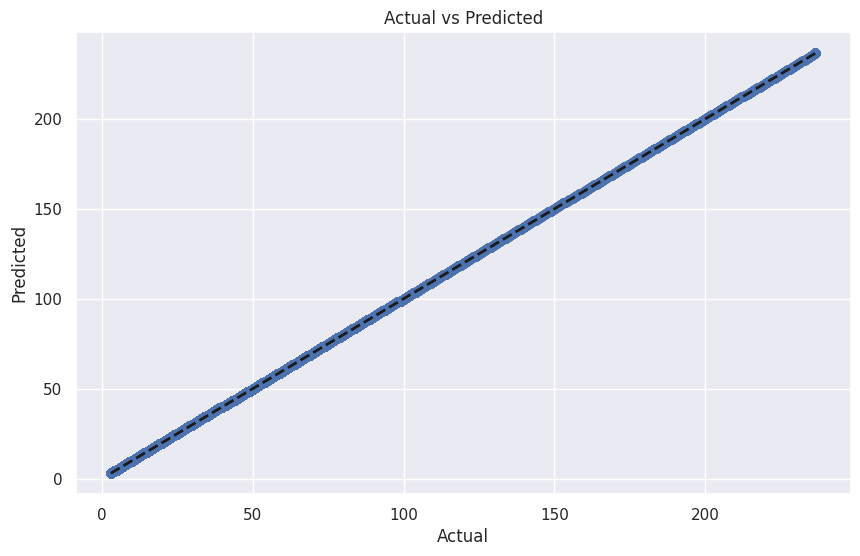

In [ ]:
# Import essential libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV, TimeSeriesSplit, cross_val_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor  # Added Decision Tree
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import warnings
warnings.filterwarnings('ignore')

# Step 1: Preparing the Data for Modeling
print("Step 1: Preparing the Data for Modeling")
print("-" * 50)

# Define target variable (e.g., PM2.5)
target = 'PM2.5'
exclude_cols = [target, 'datetime', 'date', 'year_month', 'pollution_category', 'WSPM']
potential_leakage = ['PM10']
feature_cols = [col for col in df.columns if col not in exclude_cols and col not in potential_leakage]

numeric_features = df[feature_cols].select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_features = df[feature_cols].select_dtypes(include=['object', 'category']).columns.tolist()

X = df[feature_cols]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# Step 2: Feature Engineering and Preprocessing
print("\nStep 2: Feature Engineering and Preprocessing")
print("-" * 50)

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), categorical_features)
    ])

# Step 3: Model Selection and Evaluation
print("\nStep 3: Model Selection and Evaluation")
print("-" * 50)

models = {
    'Linear Regression': LinearRegression(),
    'Ridge Regression': Ridge(),
    'Random Forest': RandomForestRegressor(n_estimators=10, random_state=42, n_jobs=-1),
    'Gradient Boosting': GradientBoostingRegressor(n_estimators=10, random_state=42),
    'KNN': KNeighborsRegressor(n_neighbors=5),
    'Decision Tree': DecisionTreeRegressor(random_state=42)  # Added Decision Tree Regressor
}

def evaluate_models(models, X, y, preprocessor):
    results = {}
    tscv = TimeSeriesSplit(n_splits=2)

    for name, model in models.items():
        print(f"Evaluating {name}...")
        pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('model', model)])
        try:
            cv_scores = cross_val_score(pipeline, X, y, cv=tscv, scoring='neg_mean_squared_error', n_jobs=-1)
            rmse_scores = np.sqrt(-cv_scores)
            results[name] = {
                'mean_rmse': rmse_scores.mean(),
                'std_rmse': rmse_scores.std()
            }
            print(f"  RMSE: {rmse_scores.mean():.2f} (±{rmse_scores.std():.2f})")
        except Exception as e:
            print(f"Error evaluating {name}: {e}")
    return results

model_results = evaluate_models(models, X_train, y_train, preprocessor)

best_model_name = min(model_results, key=lambda x: model_results[x]['mean_rmse'])
print(f"\nBest model: {best_model_name} with RMSE = {model_results[best_model_name]['mean_rmse']:.2f}")

# Step 4: Hyperparameter Tuning for Best Model
print("\nStep 4: Hyperparameter Tuning for Best Model")
print("-" * 50)

param_grids = {
    'Ridge Regression': {'model__alpha': [0.01, 0.1, 1.0, 10.0]},
    'Random Forest': {
        'model__n_estimators': [10, 50],
        'model__max_depth': [None, 10],
        'model__min_samples_split': [2, 5]
    },
    'Gradient Boosting': {
        'model__n_estimators': [10, 50],
        'model__learning_rate': [0.01, 0.1],
        'model__max_depth': [3, 5]
    },
    'KNN': {
        'model__n_neighbors': [3, 5, 7],
        'model__weights': ['uniform', 'distance'],
        'model__p': [1, 2]
    },
    'Decision Tree': {  # Added Decision Tree param grid
        'model__max_depth': [None, 10],
        'model__min_samples_split': [2, 5],
        'model__max_features': [None, 'sqrt', 'log2']
    }
}

best_model = models[best_model_name]
best_param_grid = param_grids.get(best_model_name, {})

if best_param_grid:
    print(f"Tuning hyperparameters for {best_model_name}...")
    pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('model', best_model)])
    grid_search = GridSearchCV(pipeline, param_grid=best_param_grid, cv=TimeSeriesSplit(n_splits=2), scoring='neg_mean_squared_error', n_jobs=-1)
    grid_search.fit(X_train, y_train)
    print(f"Best parameters: {grid_search.best_params_}")
    final_model = grid_search.best_estimator_
else:
    final_model = Pipeline(steps=[('preprocessor', preprocessor), ('model', best_model)])
    final_model.fit(X_train, y_train)

# Step 5: Final Model Evaluation
print("\nStep 5: Final Model Evaluation")
print("-" * 50)

y_pred = final_model.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Test set RMSE: {rmse:.2f}")
print(f"Test set MAE: {mae:.2f}")
print(f"Test set R²: {r2:.4f}")

# Plot actual vs predicted
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.title('Actual vs Predicted')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.show()


In [ ]:
# Extract feature importances from the Random Forest model
feature_importances = final_model.named_steps['model'].feature_importances_

# Ensure the preprocessor is fitted
preprocessor.fit(X_train)

# Get feature names for numeric and categorical features
numeric_feature_names = numeric_features
categorical_feature_names = list(preprocessor.named_transformers_['cat'].get_feature_names_out(categorical_features))

# Combine numeric and categorical feature names
feature_names = numeric_feature_names + categorical_feature_names

# Create a DataFrame for feature importances
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Display the feature importance DataFrame
print(importance_df)

In [ ]:
from joblib import dump, load

# Save the model
dump(final_model, 'random_forest_pm25_model.joblib')
print("Model saved as 'random_forest_pm25_model.joblib'")

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Feature Importance Plot
def plot_feature_importance(importance_df):
    plt.figure(figsize=(10, 6))
    sns.barplot(x='Importance', y='Feature', data=importance_df.head(10))
    plt.title('Top 10 Feature Importances')
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.show()

# Prediction vs. Actual Line Plot
def plot_prediction_vs_actual(y_test, y_pred):
    plt.figure(figsize=(10, 6))
    plt.plot(y_test.values, label='Actual', alpha=0.7)
    plt.plot(y_pred, label='Predicted', alpha=0.7)
    plt.title('Actual vs Predicted (Line Plot)')
    plt.xlabel('Sample Index')
    plt.ylabel('PM2.5')
    plt.legend()
    plt.show()

# Residuals Analysis
def plot_residuals(y_test, y_pred):
    residuals = y_test - y_pred

    # Residuals vs. Predicted
    plt.figure(figsize=(10, 6))
    plt.scatter(y_pred, residuals, alpha=0.5)
    plt.axhline(0, color='red', linestyle='--', linewidth=1)
    plt.title('Residuals vs Predicted')
    plt.xlabel('Predicted')
    plt.ylabel('Residuals')
    plt.show()

    # Residuals Histogram
    plt.figure(figsize=(10, 6))
    sns.histplot(residuals, kde=True, bins=30)
    plt.title('Residuals Distribution')
    plt.xlabel('Residuals')
    plt.ylabel('Frequency')
    plt.show()

# Predicted vs. Actual (Density Plot)
def plot_density(y_test, y_pred):
    plt.figure(figsize=(10, 6))
    sns.kdeplot(y_test, label='Actual', shade=True)
    sns.kdeplot(y_pred, label='Predicted', shade=True)
    plt.title('Density Plot: Actual vs Predicted')
    plt.xlabel('PM2.5')
    plt.ylabel('Density')
    plt.legend()
    plt.show()



# Feature Importance
plot_feature_importance(importance_df)

# Prediction vs. Actual (Line Plot)
plot_prediction_vs_actual(y_test, y_pred)

# Residuals Analysis
plot_residuals(y_test, y_pred)

# Density Plot
plot_density(y_test, y_pred)


In [ ]:
# Step 3: Model Selection and Evaluation with R² Score
def evaluate_models(models, X, y, preprocessor):
    results = {}
    tscv = TimeSeriesSplit(n_splits=2)

    for name, model in models.items():
        print(f"Evaluating {name}...")
        pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('model', model)])
        try:
            # Cross-validation and R² score calculation
            cv_scores = cross_val_score(pipeline, X, y, cv=tscv, scoring='r2', n_jobs=-1)
            results[name] = {
                'mean_r2': cv_scores.mean(),
                'std_r2': cv_scores.std()
            }
            print(f"  R²: {cv_scores.mean():.4f} (±{cv_scores.std():.4f})")
        except Exception as e:
            print(f"Error evaluating {name}: {e}")
    return results

# Evaluate the models
model_results = evaluate_models(models, X_train, y_train, preprocessor)

# Step 5: Visualize the results using a line graph
# Plot the R² scores of each model
model_names = list(model_results.keys())
r2_scores = [model_results[name]['mean_r2'] for name in model_names]

plt.figure(figsize=(10, 6))
plt.plot(model_names, r2_scores, marker='o', linestyle='-', color='b')
plt.title('Model Accuracy (R²) Comparison')
plt.xlabel('Model')
plt.ylabel('R² Score')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

# Output the best model based on R²
best_model_name = max(model_results, key=lambda x: model_results[x]['mean_r2'])
print(f"\nBest model: {best_model_name} with R² = {model_results[best_model_name]['mean_r2']:.4f}")


In [ ]:
# Example predictions
example_indices = [0, 1, 2]
example_predictions = y_pred[example_indices]
example_actuals = y_test.iloc[example_indices]

for idx, (pred, actual) in enumerate(zip(example_predictions, example_actuals)):
    print(f"Example {idx}: Predicted = {pred:.2f}, Actual = {actual:.2f}")

In [ ]:
df.shape

In [ ]:
df.columns

In [ ]:
df.isnull().sum()


#Task 4